In [60]:
import pandas as pd
import time
import numpy as np
import struct
import matplotlib.pyplot as plt
from cr_data_inspection_functions import *
from lwa_antpos import mapping
from scipy.optimize import curve_fit
import scipy.stats as st
import math


In [61]:
h= np.asarray([0.000049291111379545783611425685544205066,
               0.012255497574972781804625299173494568095,
               0.085289616177628382875930412865272955969,
               -0.063136263203890236050952466939634177834,
               -0.021489412960359111082198069198057055473,
               -0.067555957743183181474222465112688951194,
               -0.017706118779731286339007567676162580028,
               0.080882151494431037130894424080906901509,
               -0.014358148251631907416081546102759602945,
               0.093835202832724035060252276707615237683,
               -0.280577771800571862392814637132687494159,
               -0.129748808680352711864003367736586369574,
               0.501393724111570460166831253445707261562,
               -0.129748808680352711864003367736586369574,
               -0.280577771800571862392814637132687494159,
               0.093835202832724035060252276707615237683,
               -0.014358148251631907416081546102759602945,
               0.080882151494431037130894424080906901509,
               -0.017706118779731286339007567676162580028,
               -0.067555957743183181474222465112688951194,
               -0.021489412960359111082198069198057055473,
               -0.063136263203890236050952466939634177834,
               0.085289616177628382875930412865272955969,
               0.012255497574972781804625299173494568095,
               0.000049291111379545783611425685544205066])

In [62]:
datadir='/data0/cosmic-ray-data/2023August9/'#+'overnight16882'
dataproductsdir='/data0/cosmic-ray-data/2023August9-dataproducts/'

#datadir='/data0/cosmic-ray-data/2023July4/'+'overnight16885'
#dataproductsdir='/data0/cosmic-ray-data/2023July4-data-products/'

In [56]:
#summary_filename='/data0/cosmic-ray-data/2023May3-dataproducts/summary.txt'
#summary_filename0='/data0/cosmic-ray-data/2023June20-data-products/summary.txt'
#summary_filename1='/data1/cosmic-ray-data/2023June20-data-products/summary.txt'
#summary_filename='/data1/cosmic-ray-data/2023July1-data-products/summary.txt'
#summary_filename='/data0/cosmic-ray-data/2023July4-data-products/summary.txt'
summary_filename='/data0/cosmic-ray-data/2023August9-dataproducts/summary.txt'

summary_filenames=[summary_filename]

colnames=['fname',
          'config_file',
          'total_event_count',
          'complete_events_count',
          'incomplete_events_count',
          'scrambled_complete_events',
          'pass_rms_change_cut',
          'pass_veto_cut',
          'pass_max_distant_vs_core_cut',
          'pass_top5_distant_vs_core_cut',
          'pass_distant_vs_core_cut2',
          'total_selected_v1',
          'total_selected_v2']

all_lines=[]
for summary_filename in summary_filenames:
    with open(summary_filename) as file:
        lines = [line.rstrip().split() for line in file if (line[:2]!='St' and line[:2]!='Re')]
    all_lines+=lines
    
summary = pd.DataFrame(columns=colnames,index=range(len(all_lines)))



In [63]:
print(len(lines))
print(len(all_lines))

597
597


In [58]:
for j,line in enumerate(all_lines):
    for i in range(len(line)):
        if i>1: #the first two are strings
            line[i]=int(line[i])
    summary.loc[j]=line
            


In [16]:
valid_files=summary['complete_events_count']>0
invalid_files=summary['complete_events_count']==0
print(invalid_files.sum())

6


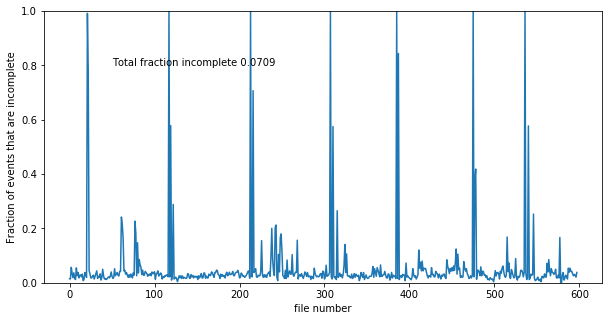

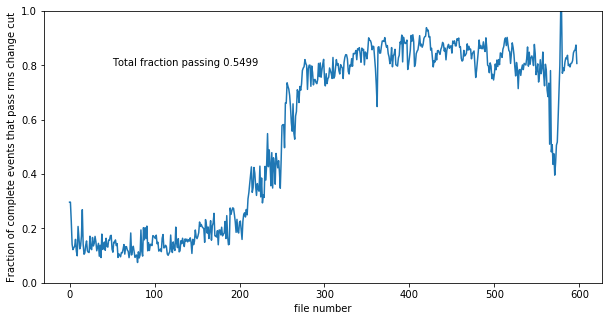

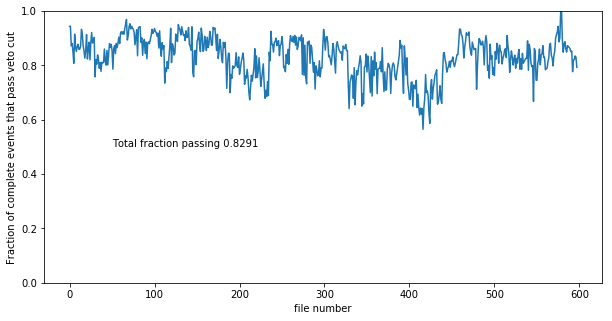

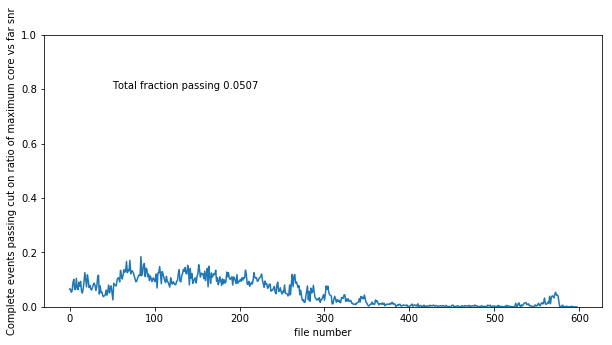

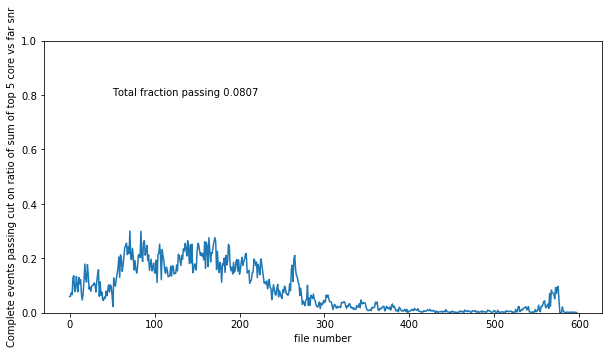

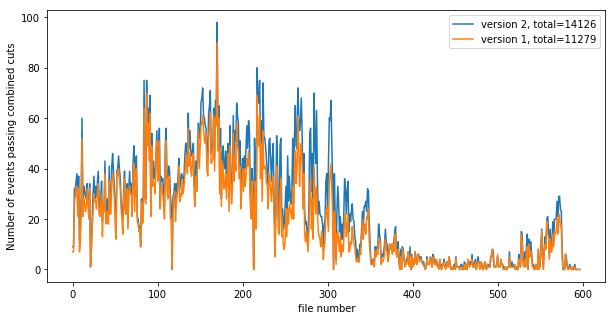

In [18]:
plt.figure(figsize=(10,5))
plt.xlabel('file number')
plt.ylabel('Fraction of events that are incomplete')
plt.plot(summary['incomplete_events_count']/summary['total_event_count'])
plt.ylim(0,1)
total=summary['incomplete_events_count'].sum()/summary['total_event_count'].sum()
plt.text(50,0.8,'Total fraction incomplete '+str(round(total,4)))

plt.figure(figsize=(10,5))
plt.xlabel('file number')
plt.ylabel('Fraction of complete events that pass rms change cut')
plt.plot(summary['pass_rms_change_cut'][valid_files]/summary['complete_events_count'][valid_files])
plt.ylim(0,1)
total=(summary['pass_rms_change_cut'][valid_files]).sum()/(summary['complete_events_count'][valid_files]).sum()
plt.text(50,0.8,'Total fraction passing '+str(round(total,4)))

plt.figure(figsize=(10,5))
plt.xlabel('file number')
plt.ylabel('Fraction of complete events that pass veto cut')
plt.plot((summary['pass_veto_cut'][valid_files])/(summary['complete_events_count'][valid_files]))
total=(summary['pass_veto_cut'][valid_files]).sum()/(summary['complete_events_count'][valid_files]).sum()
plt.text(50,0.5,'Total fraction passing '+str(round(total,4)))
plt.ylim(0,1)

plt.figure(figsize=(10,5))
plt.xlabel('file number')
plt.ylabel('Complete events passing cut on ratio of maximum core vs far snr')
plt.plot((summary['pass_max_distant_vs_core_cut'][valid_files])/(summary['complete_events_count'][valid_files]))
total=(summary['pass_max_distant_vs_core_cut'][valid_files]).sum()/(summary['complete_events_count'][valid_files]).sum()
plt.text(50,0.8,'Total fraction passing '+str(round(total,4)))

plt.ylim(0,1)

plt.figure(figsize=(10,5))
plt.xlabel('file number')
plt.ylabel('Complete events passing cut on ratio of sum of top 5 core vs far snr')
plt.plot((summary['pass_top5_distant_vs_core_cut'][valid_files])/(summary['complete_events_count'][valid_files]))
total=(summary['pass_top5_distant_vs_core_cut'][valid_files]).sum()/(summary['complete_events_count'][valid_files]).sum()
plt.text(50,0.8,'Total fraction passing '+str(round(total,4)))
plt.ylim(0,1)

plt.figure(figsize=(10,5))
plt.xlabel('file number')
plt.ylabel('Number of events passing combined cuts')
plt.plot(summary['total_selected_v2'],label='version 2, total='+str(summary['total_selected_v2'].sum()))
plt.plot(summary['total_selected_v1'],label='version 1, total='+str(summary['total_selected_v1'].sum()))
plt.legend()


In [19]:
print(summary.columns)

Index(['fname', 'config_file', 'total_event_count', 'complete_events_count',
       'incomplete_events_count', 'scrambled_complete_events',
       'pass_rms_change_cut', 'pass_veto_cut', 'pass_max_distant_vs_core_cut',
       'pass_top5_distant_vs_core_cut', 'pass_distant_vs_core_cut2',
       'total_selected_v1', 'total_selected_v2'],
      dtype='object')


In [20]:
for name in summary.columns:
    if (name!='fname' and name!='config_file'):
        print(name,summary[name].sum())
print(summary['total_selected_v1'].sum()/summary['complete_events_count'].sum())
print(summary['total_selected_v2'].sum()/summary['complete_events_count'].sum())

total_event_count 606938
complete_events_count 563878
incomplete_events_count 43060
scrambled_complete_events 0
pass_rms_change_cut 310078
pass_veto_cut 467514
pass_max_distant_vs_core_cut 28571
pass_top5_distant_vs_core_cut 45512
pass_distant_vs_core_cut2 52914
total_selected_v1 11279
total_selected_v2 14126
0.020002553743894955
0.025051518236214217


## Examine events that passed 
Since thousands of events passed this version of the cuts, I picked 5 files from the quieter part of the observation to inspect.

In [32]:

##load arraymap
array_map=pd.read_csv('array-map-5-22-2023.csv')
xdict={}
ydict={}
zdict={}
for i,n in enumerate(array_map['antname']):
    xdict[n]=array_map['x'][i]
    ydict[n]=array_map['y'][i]
    zdict[n]=array_map['elevation'][i]
arraymapdictionaries=[xdict,ydict,zdict]

In [33]:
files_with_interesting_events=[]
for i in range(400,405):
    if (summary['total_selected_v1'][i]):
        print(summary['fname'][i],summary['total_selected_v1'][i],summary['total_selected_v2'][i])
        files_with_interesting_events.append(summary['fname'][i])
        

overnight1691668315.434143.dat 1 1
overnight1691668373.687501.dat 4 4
overnight1691668444.4214265.dat 2 3
overnight1691668498.8429098.dat 7 7
overnight1691668555.525675.dat 3 3


0 overnight1691668315.434143.dat


/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:203: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:377: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':


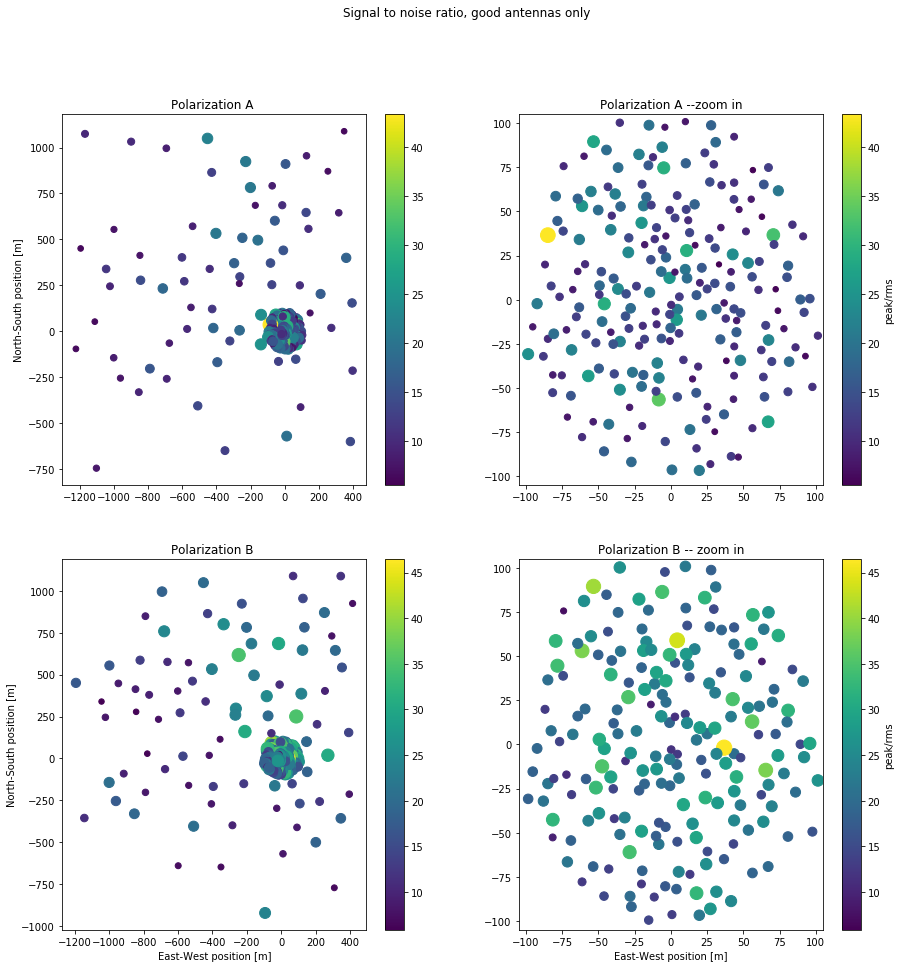

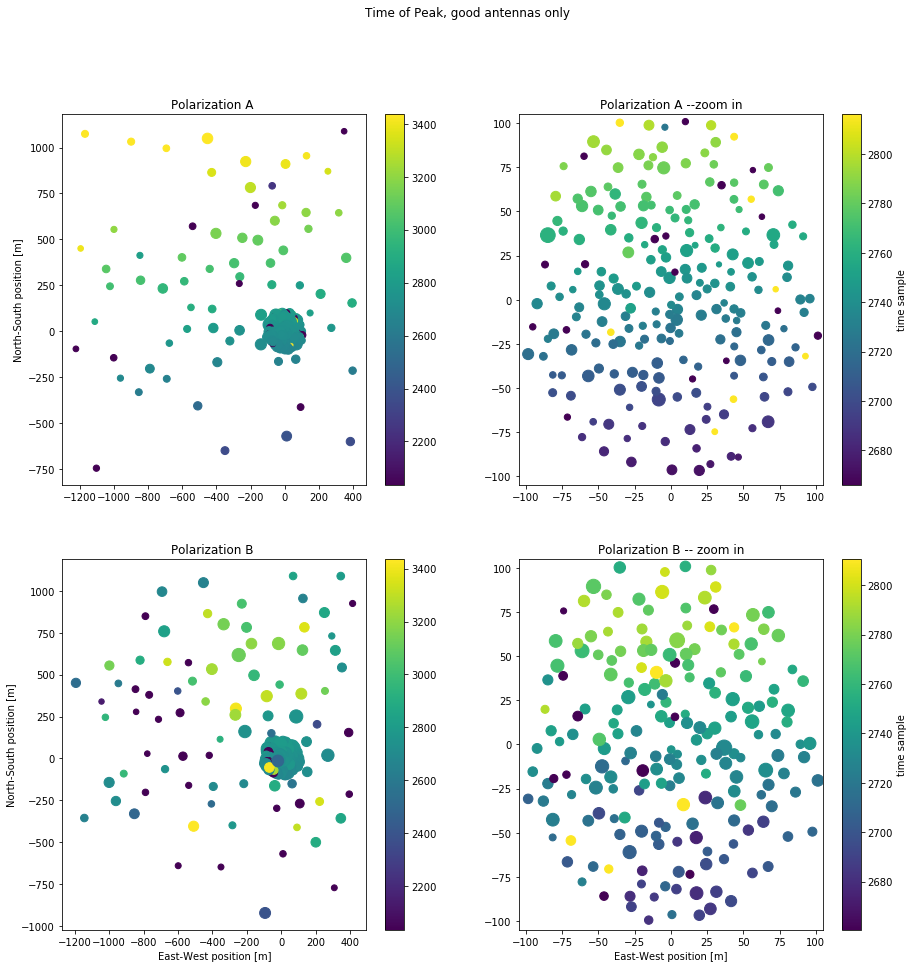

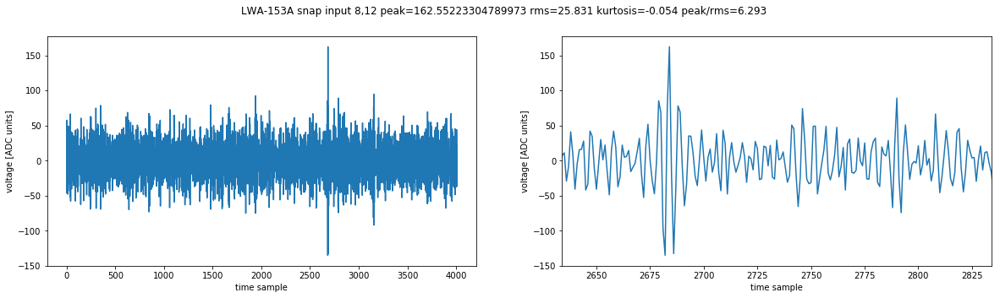

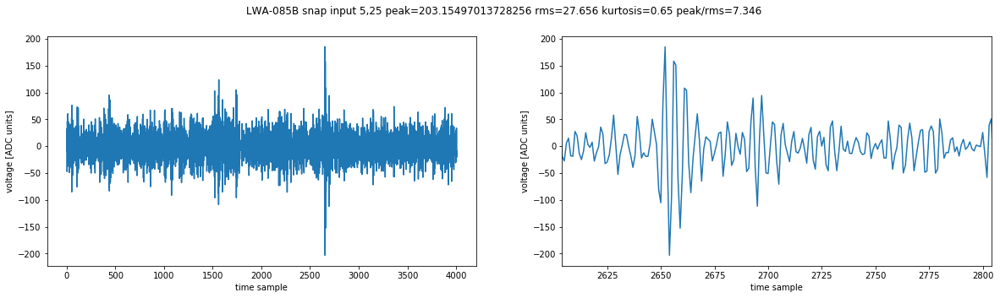

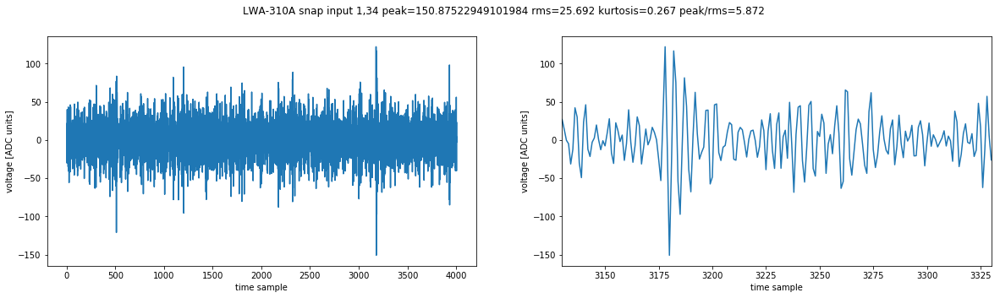

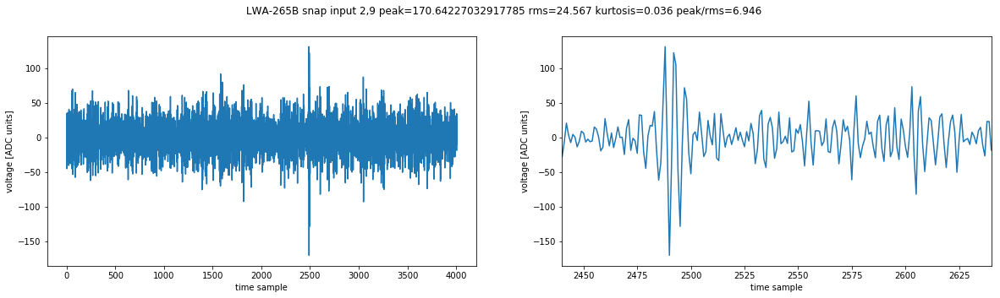

1 overnight1691668373.687501.dat


/home/ubuntu/anaconda3/envs/deployment/lib/python3.6/site-packages/numpy/core/fromnumeric.py:3335: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/ubuntu/anaconda3/envs/deployment/lib/python3.6/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


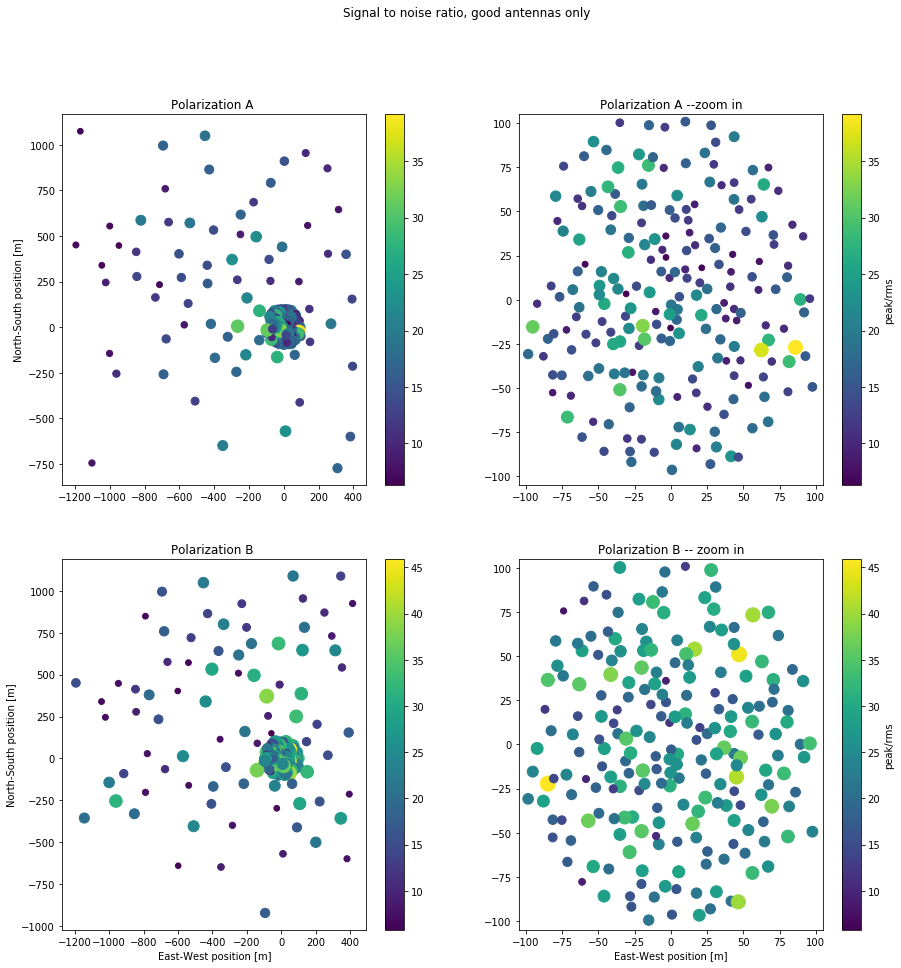

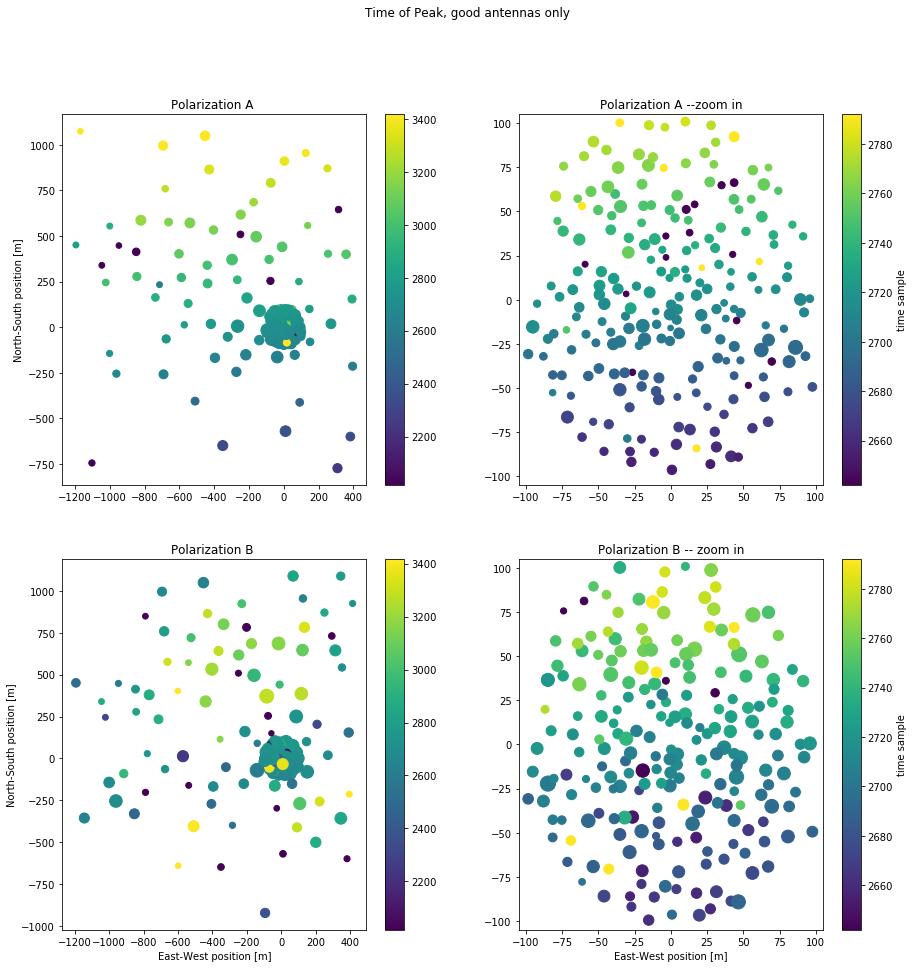

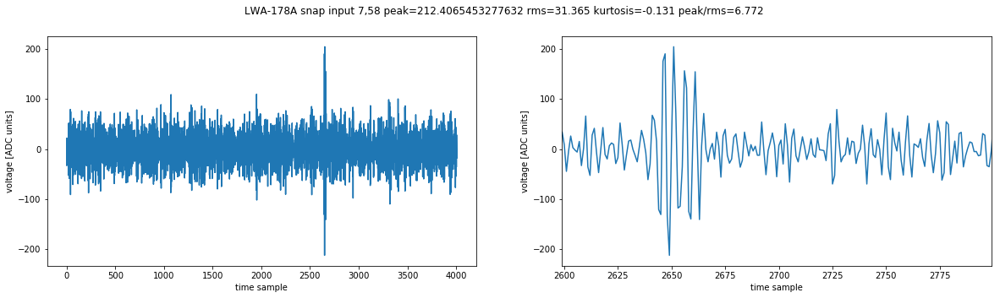

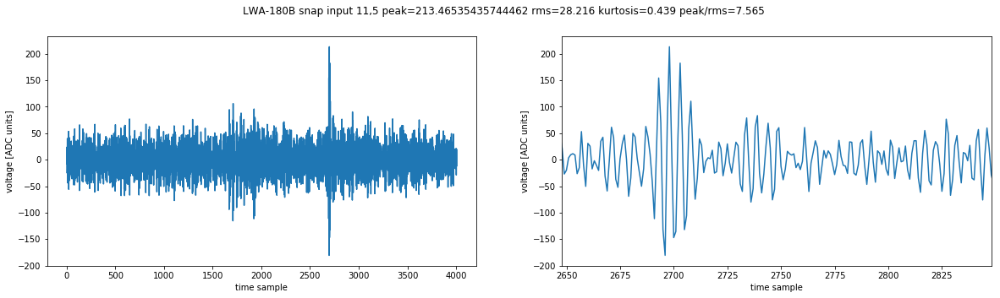

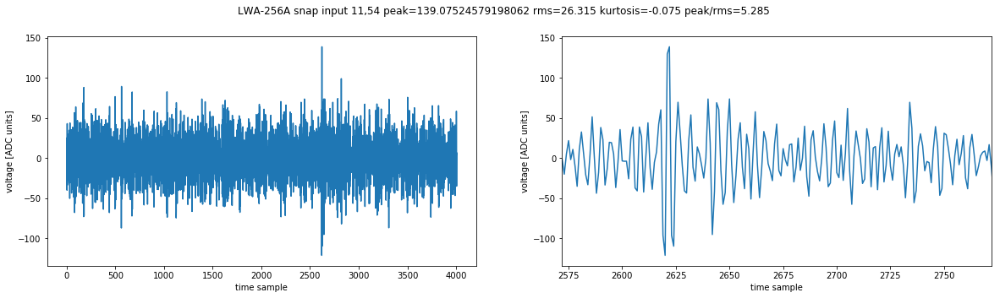

...

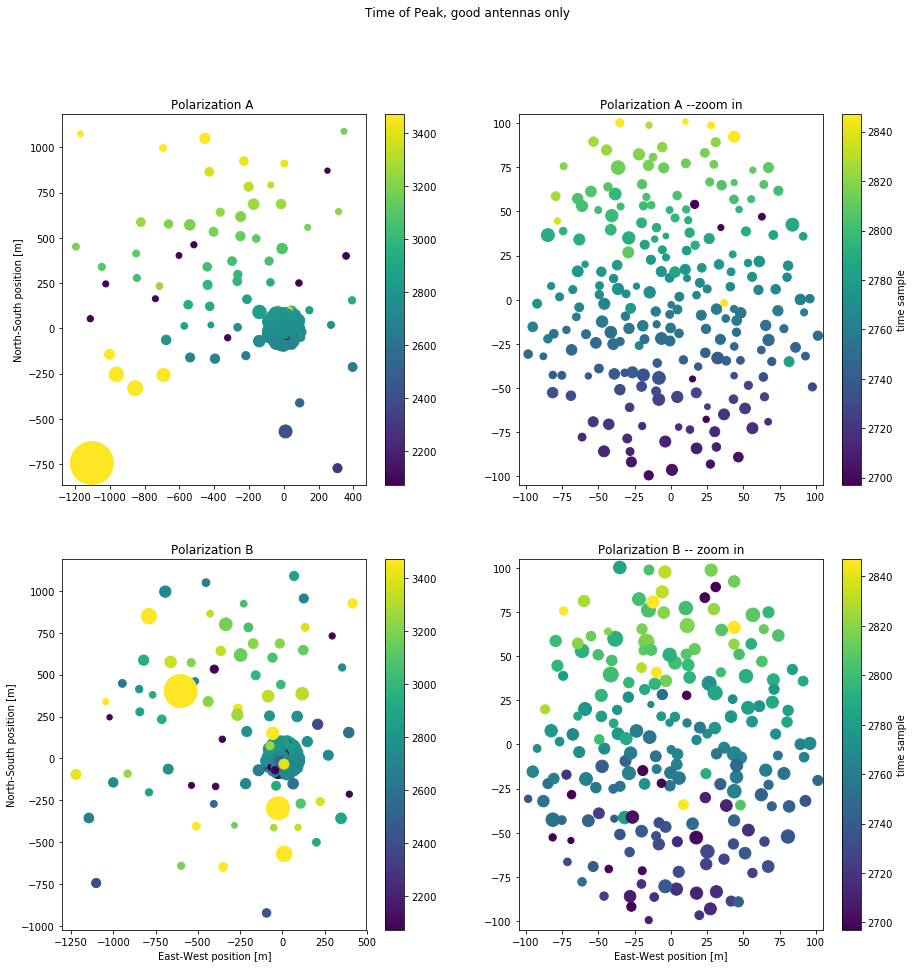

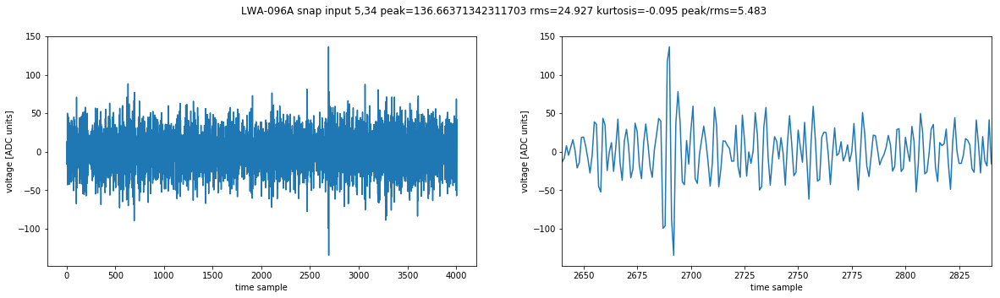

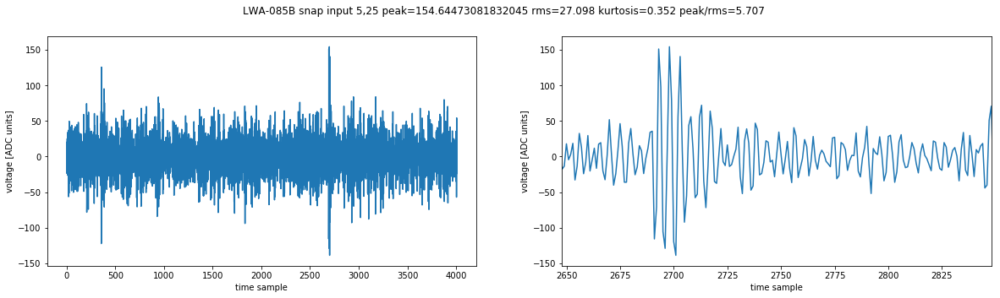

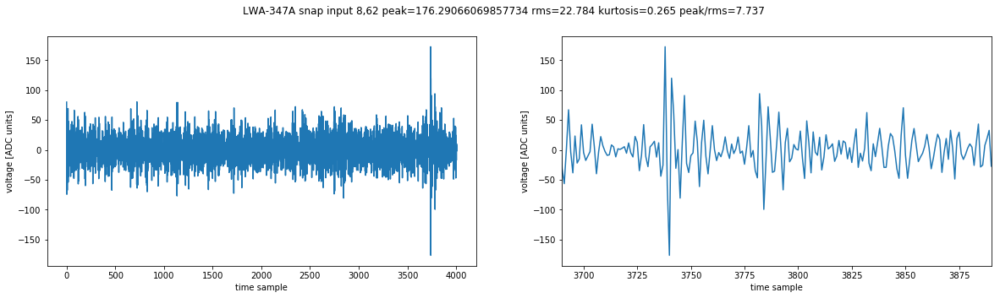

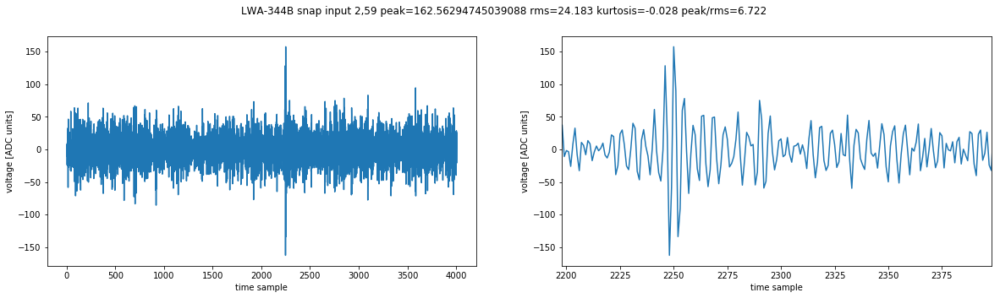

2 overnight1691668444.4214265.dat


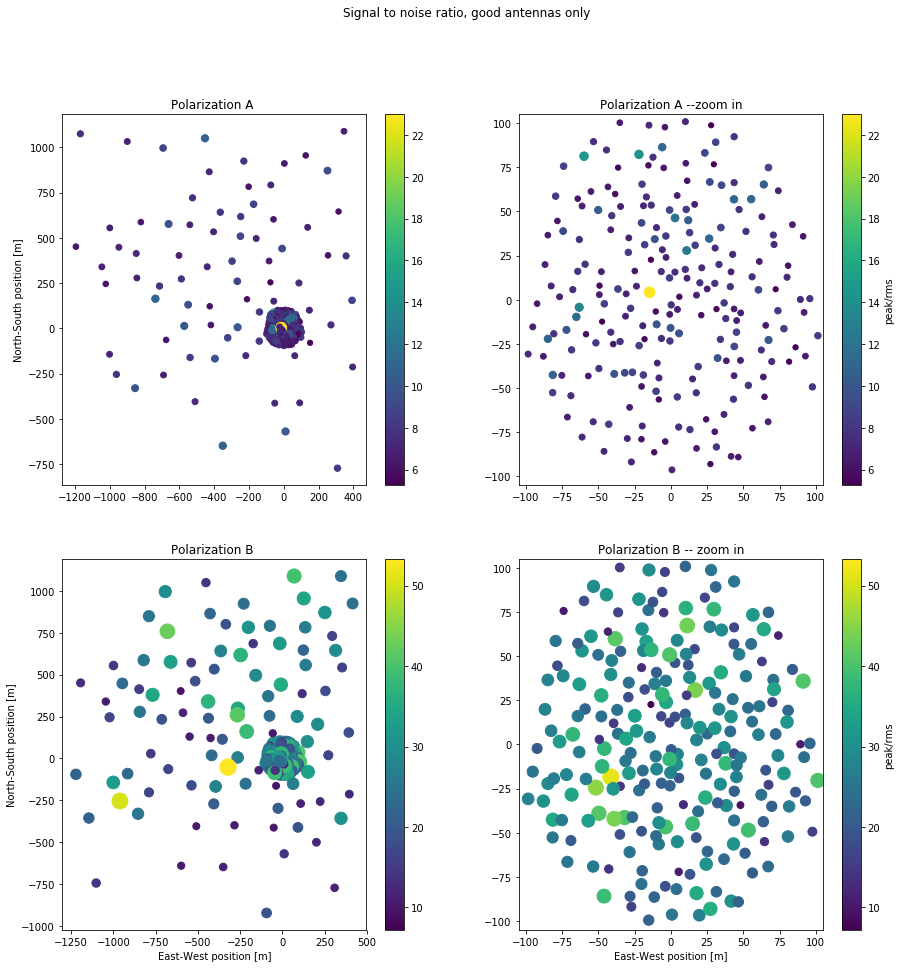

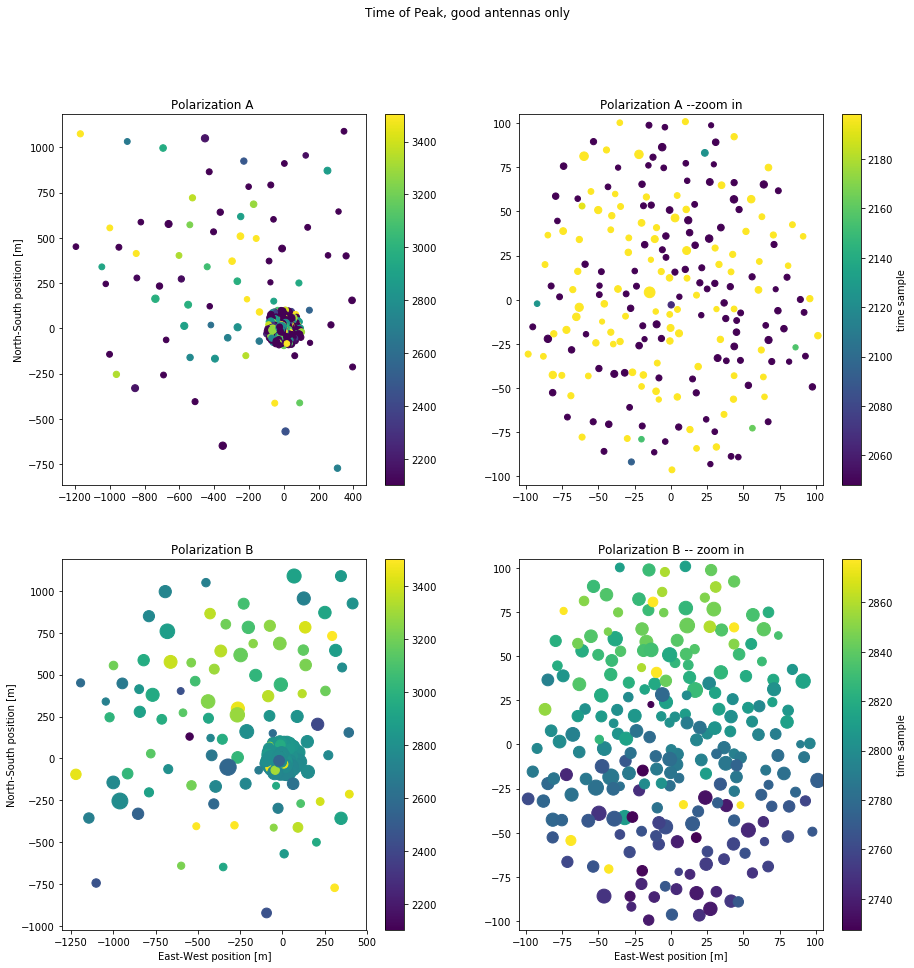

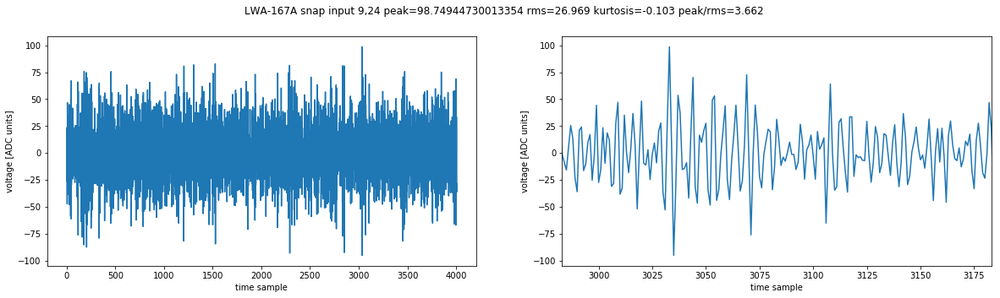

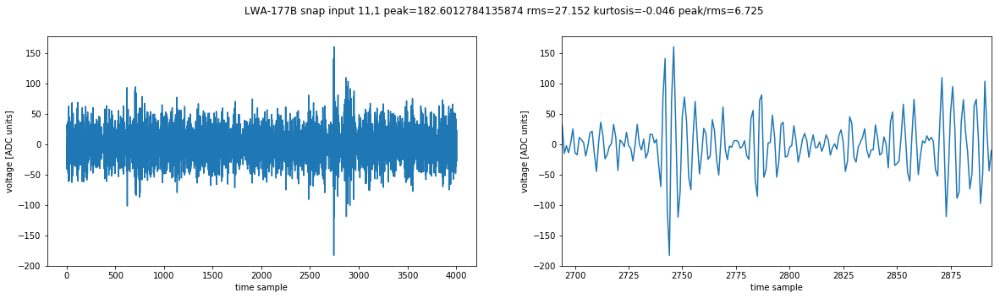

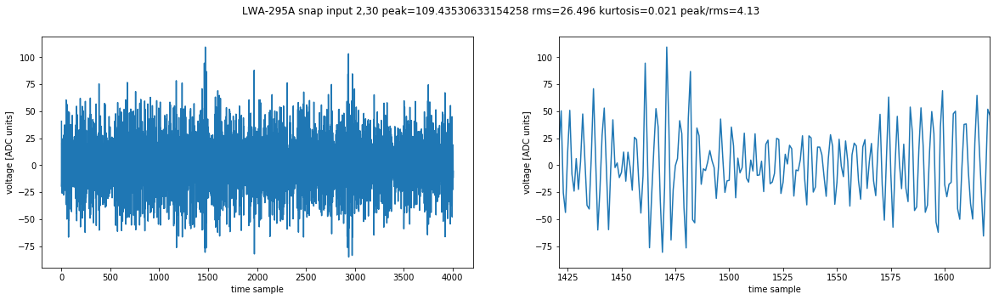

...

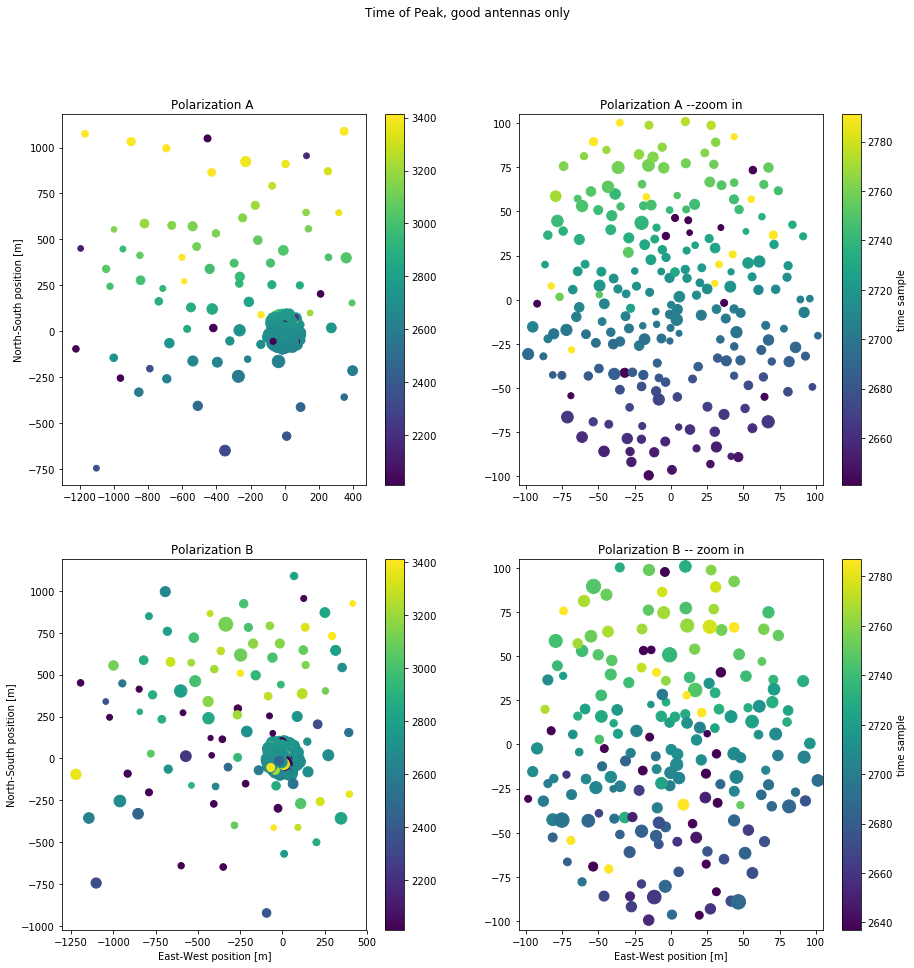

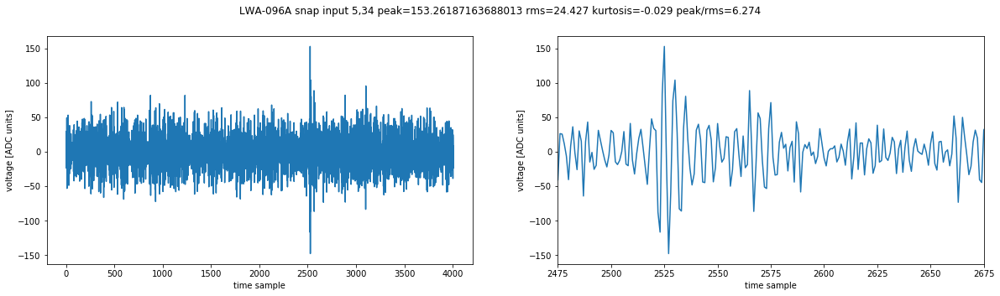

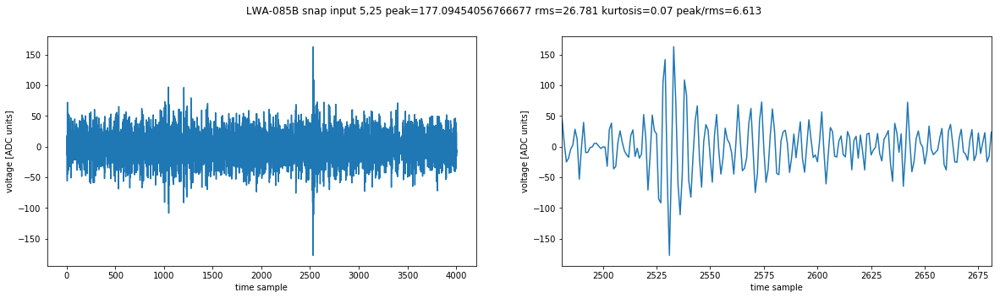

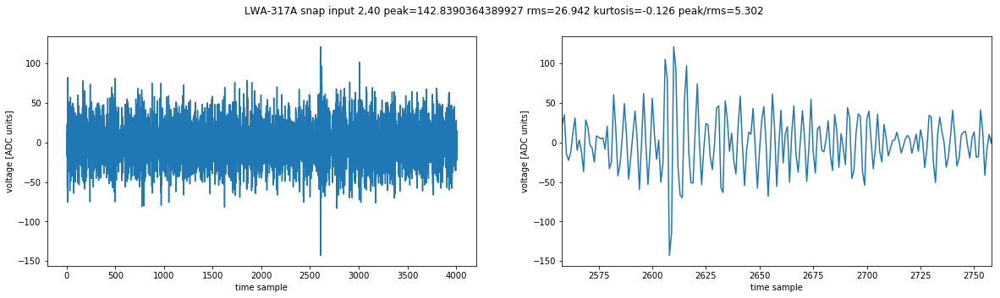

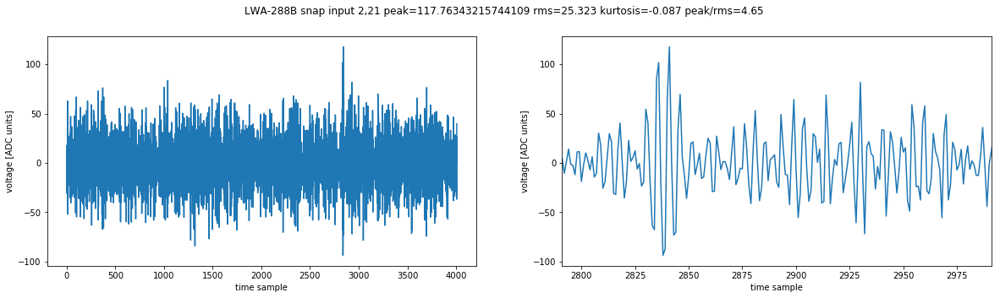

3 overnight1691668498.8429098.dat


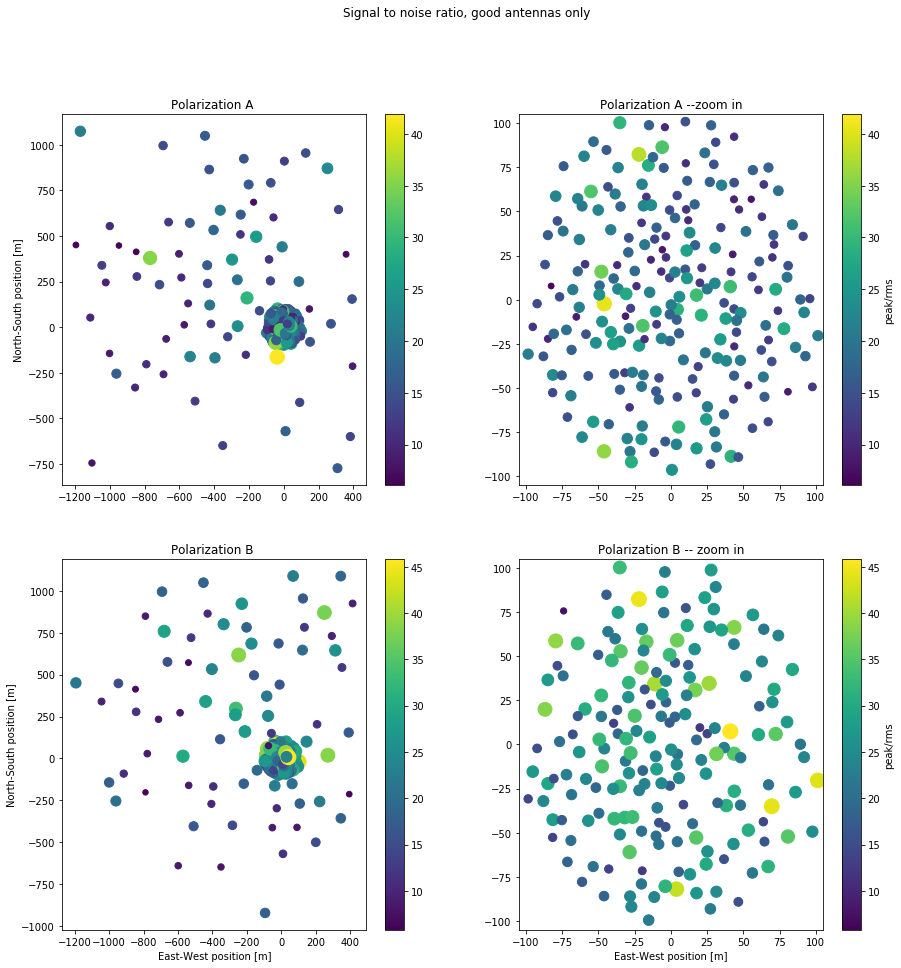

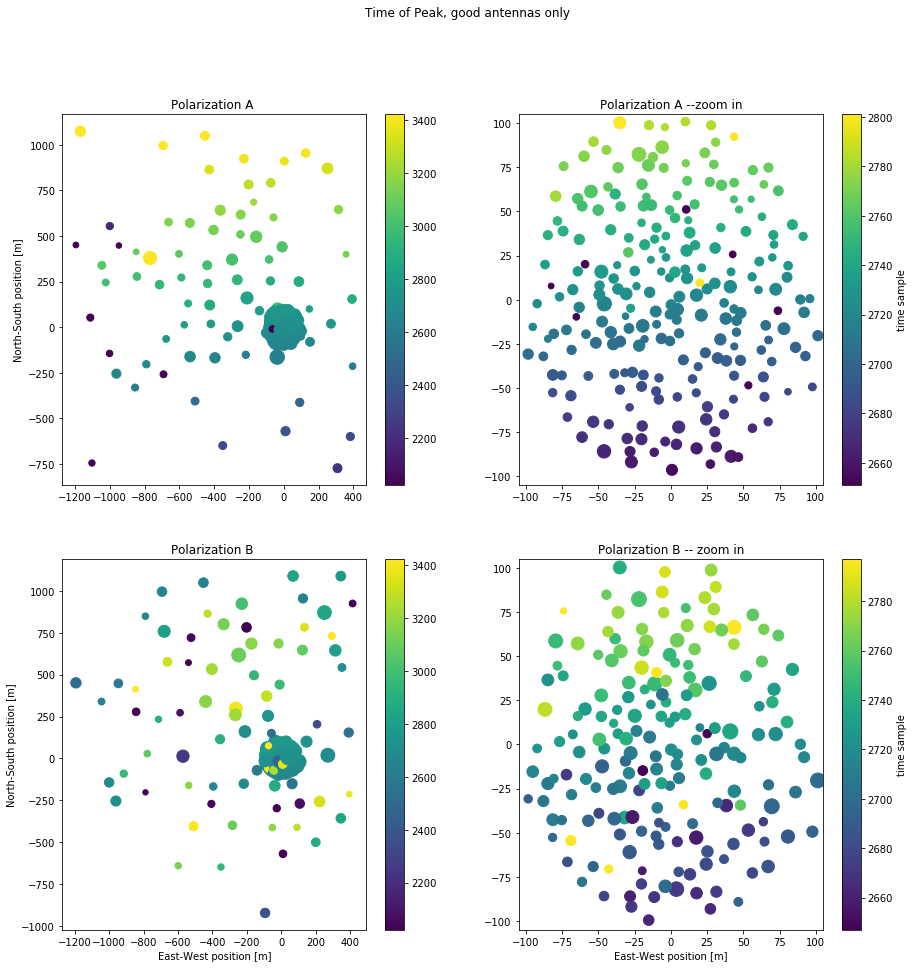

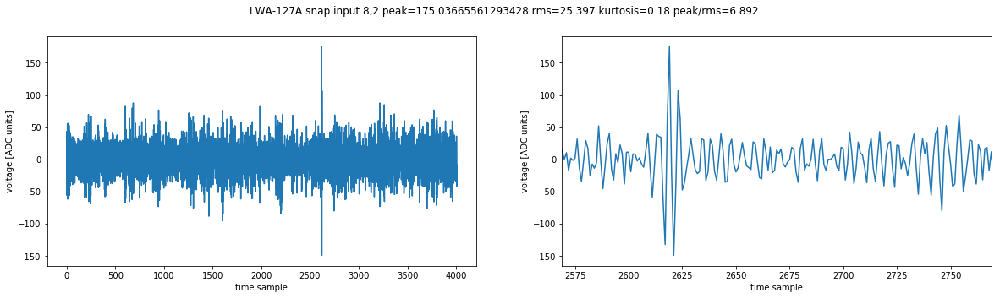

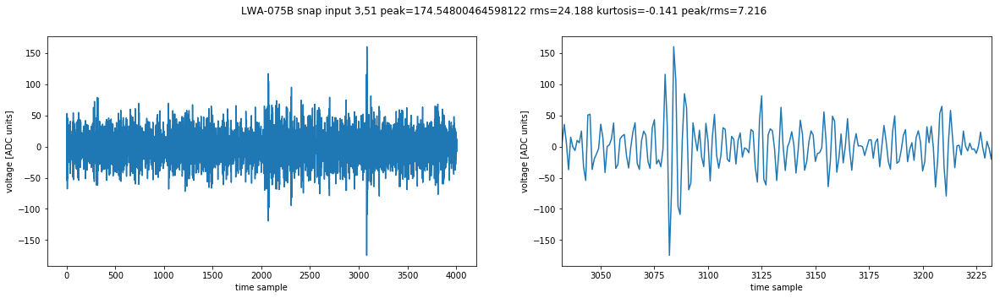

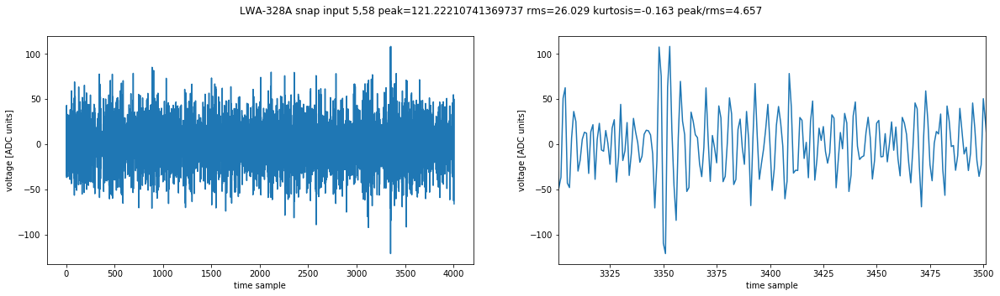

...

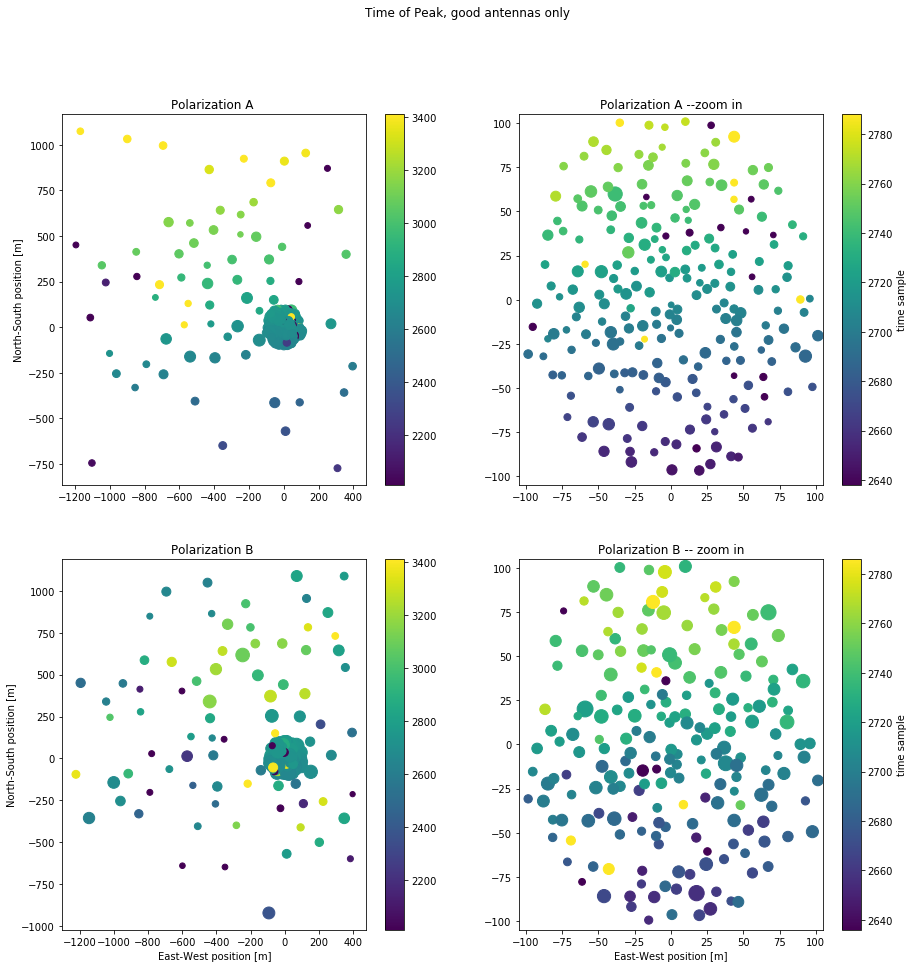

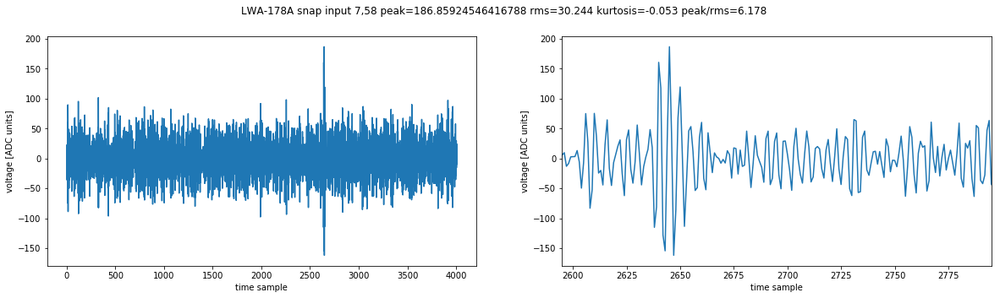

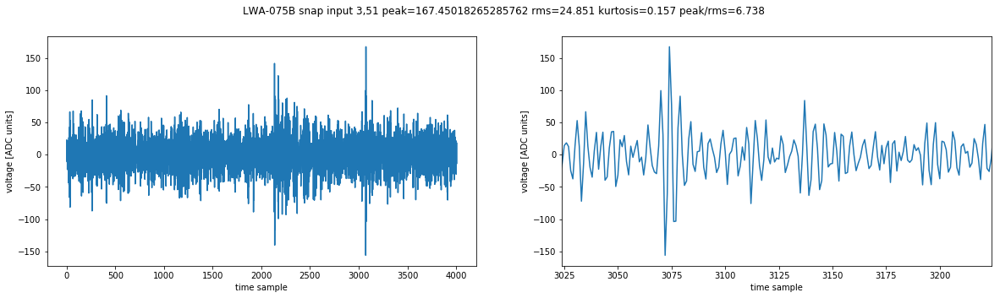

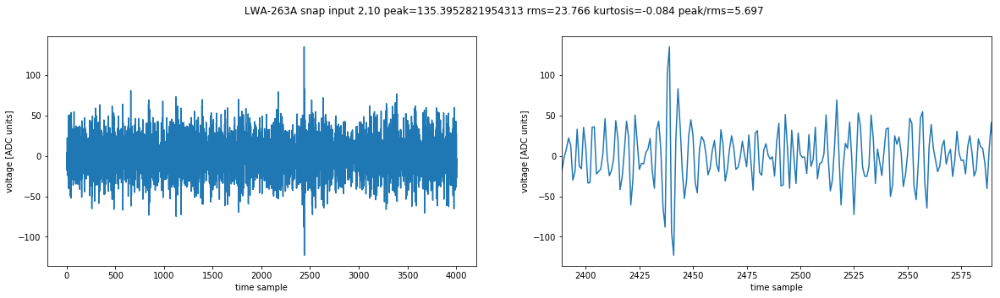

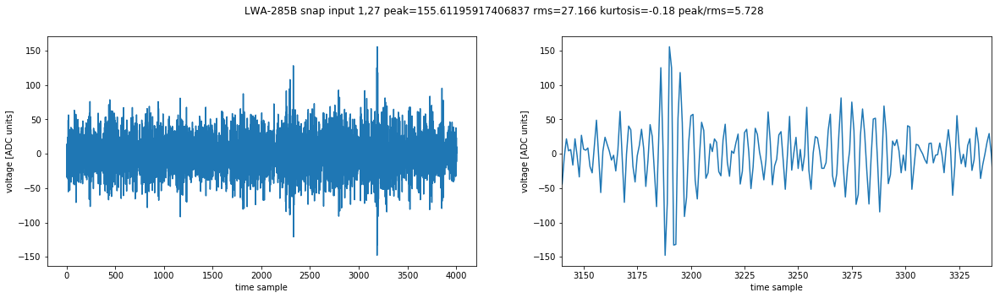

4 overnight1691668555.525675.dat


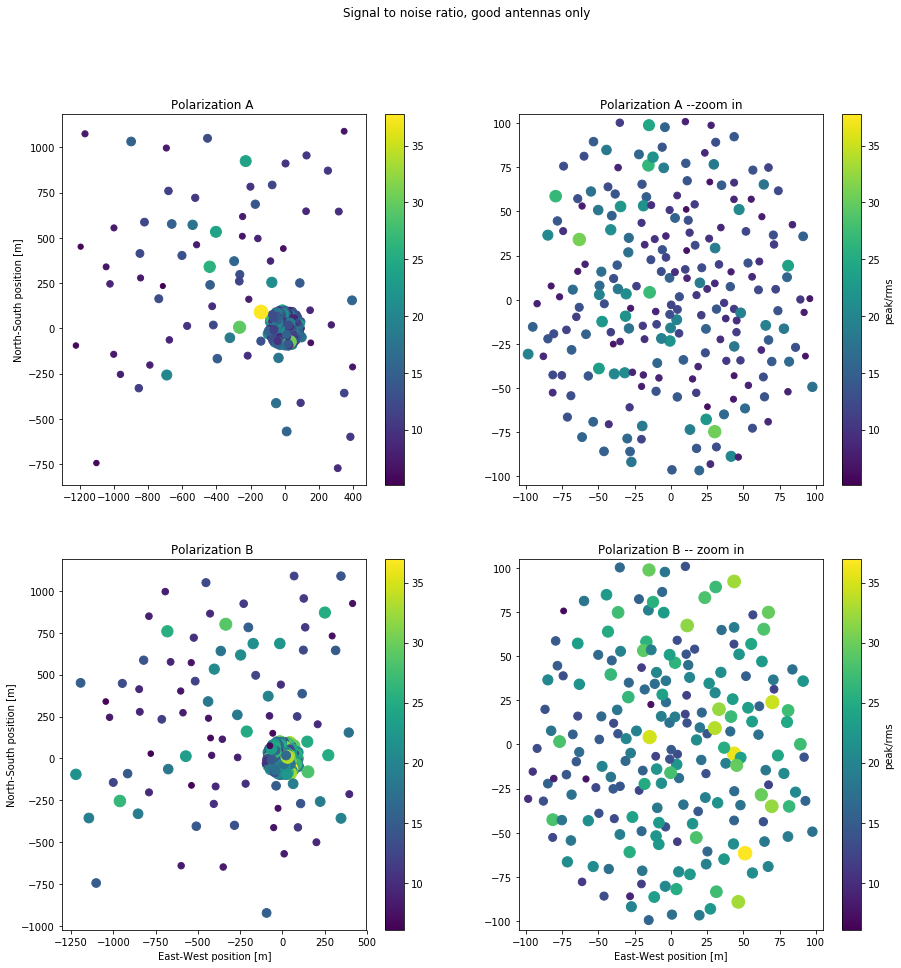

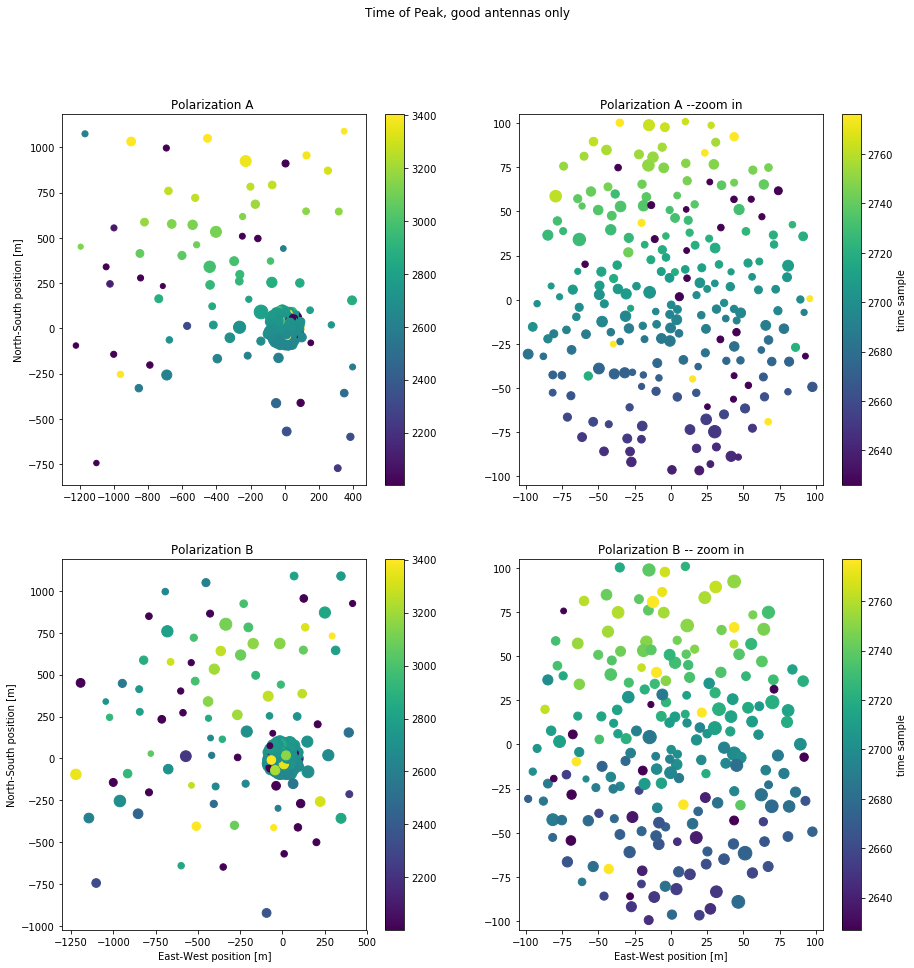

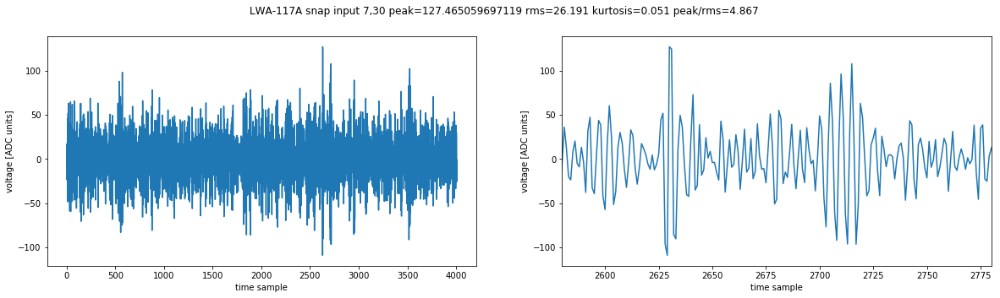

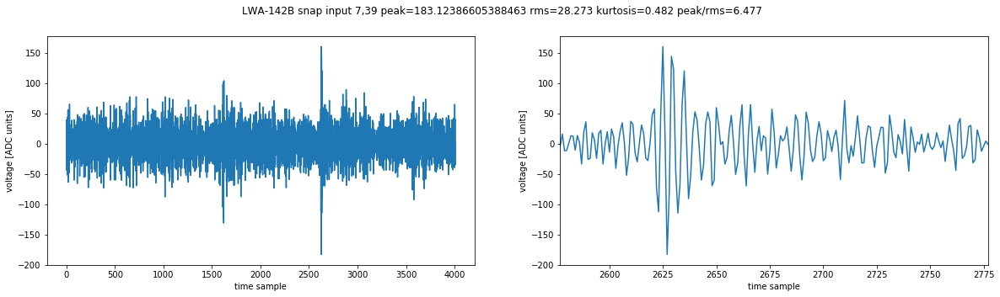

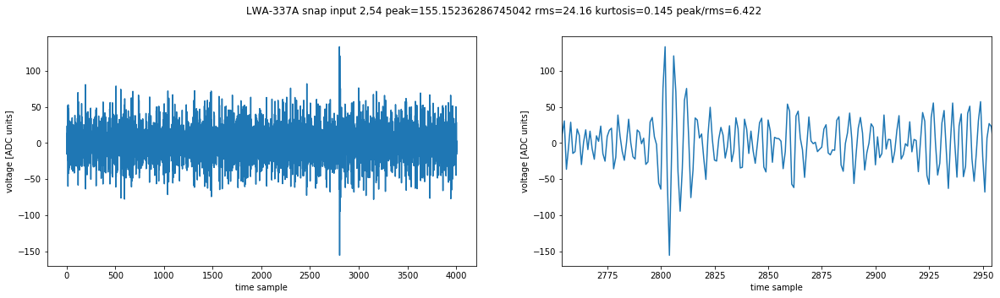

...

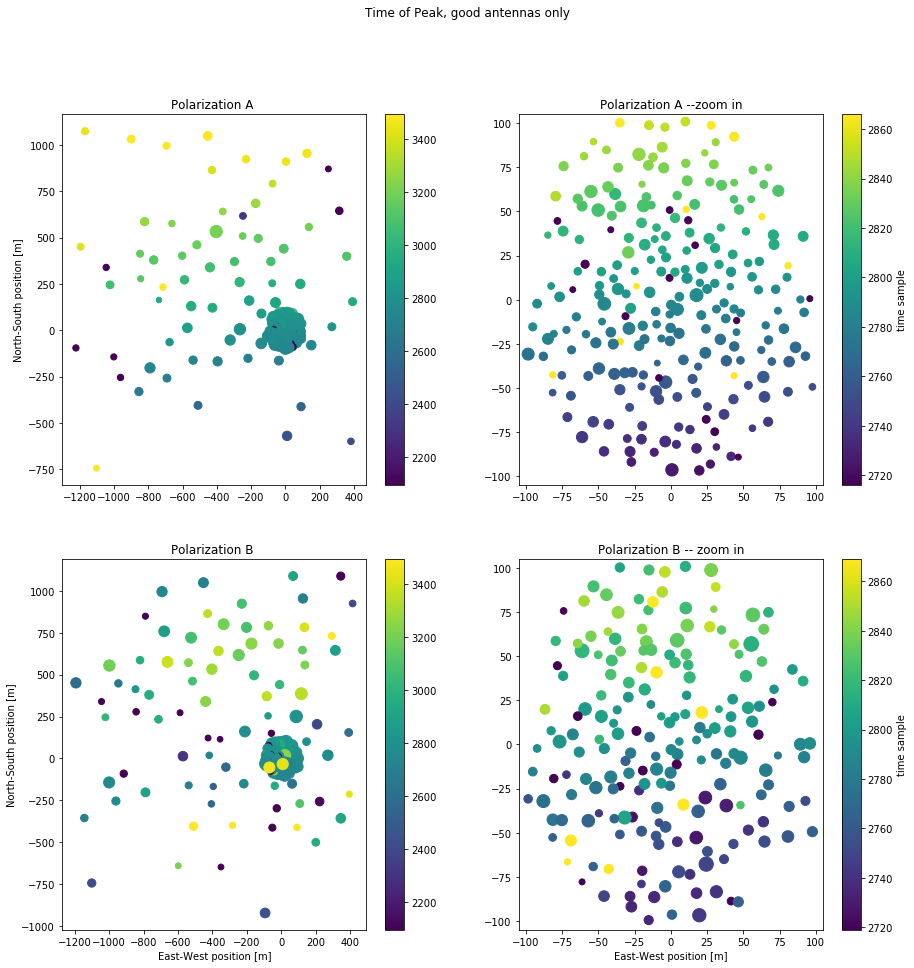

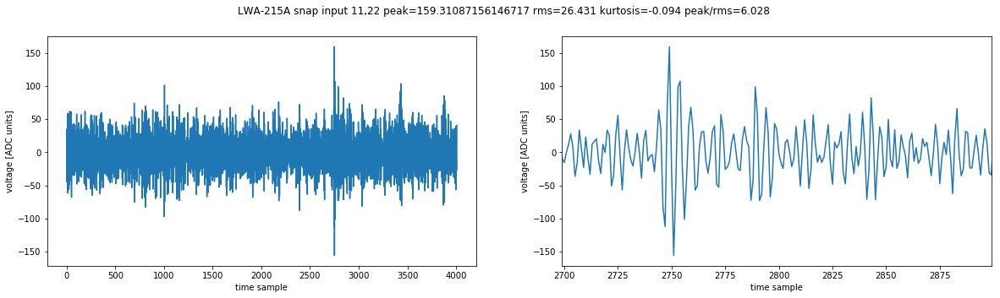

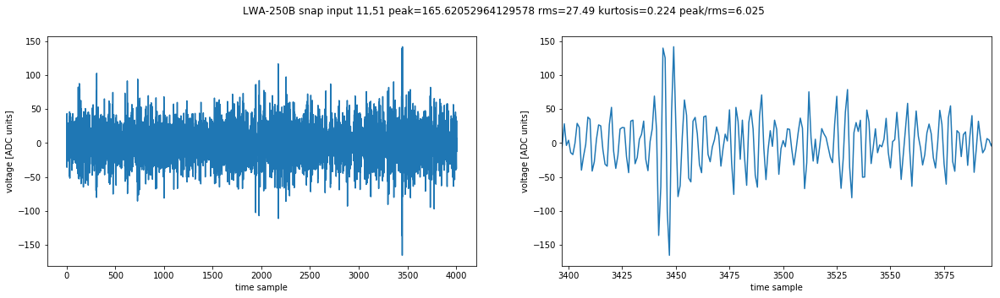

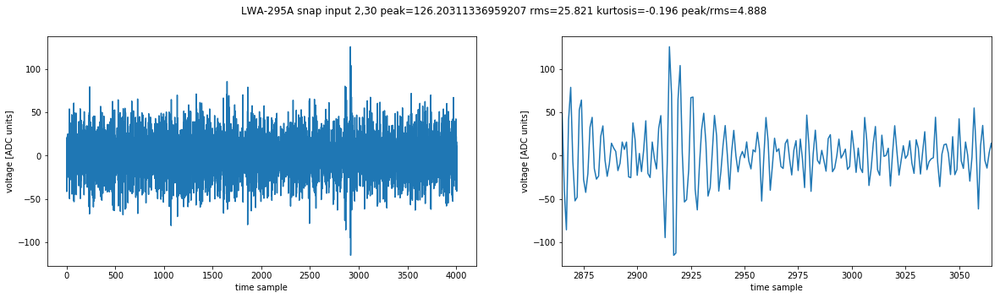

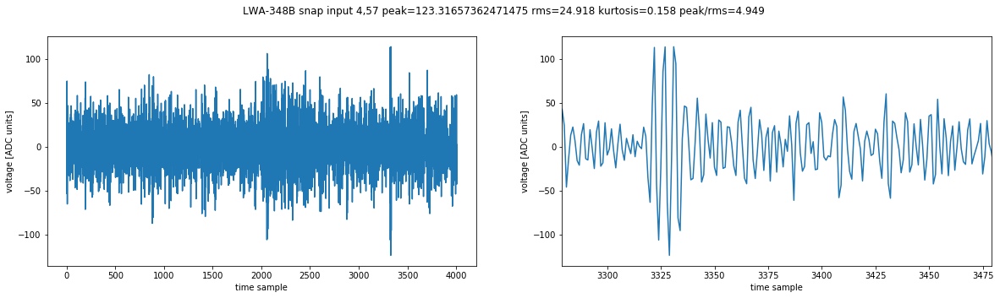

In [37]:
for f,datafname in enumerate(files_with_interesting_events):
    print(f, datafname)
    saved_events_indices=np.load(dataproductsdir+datafname[:-3]+'indices_cuts1.npy')
    for i in saved_events_indices:
        event_records=parsefile(datadir+datafname,start_ind=i,end_ind=704 )
        merged=mergepolarizations(event_records,arraymapdictionaries)
        #print(sum(['rmsB' in m.keys() for m in merged]))
        
        plot_event_snr(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=False,Filter=h)
        plot_event_toas(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=False,Filter=h)

        coreA,coreB,farA,farB=rank_by_snr(event_records,arraymapdictionaries)
        nplot=1
        for rankedlist in coreA,coreB,farA,farB:
            if len(rankedlist)>nplot:
                plot_timeseries(event_records,[A[1] for A in rankedlist[:nplot]],zoom='peak',Filter=h)
            else:
                plot_timeseries(event_records,[A[1] for A in rankedlist],zoom='peak',Filter=h)
        plt.show()

## Inspect specific events



In [35]:
print(len(summary))

598


0 overnight1691668373.687501.dat


/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:203: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':


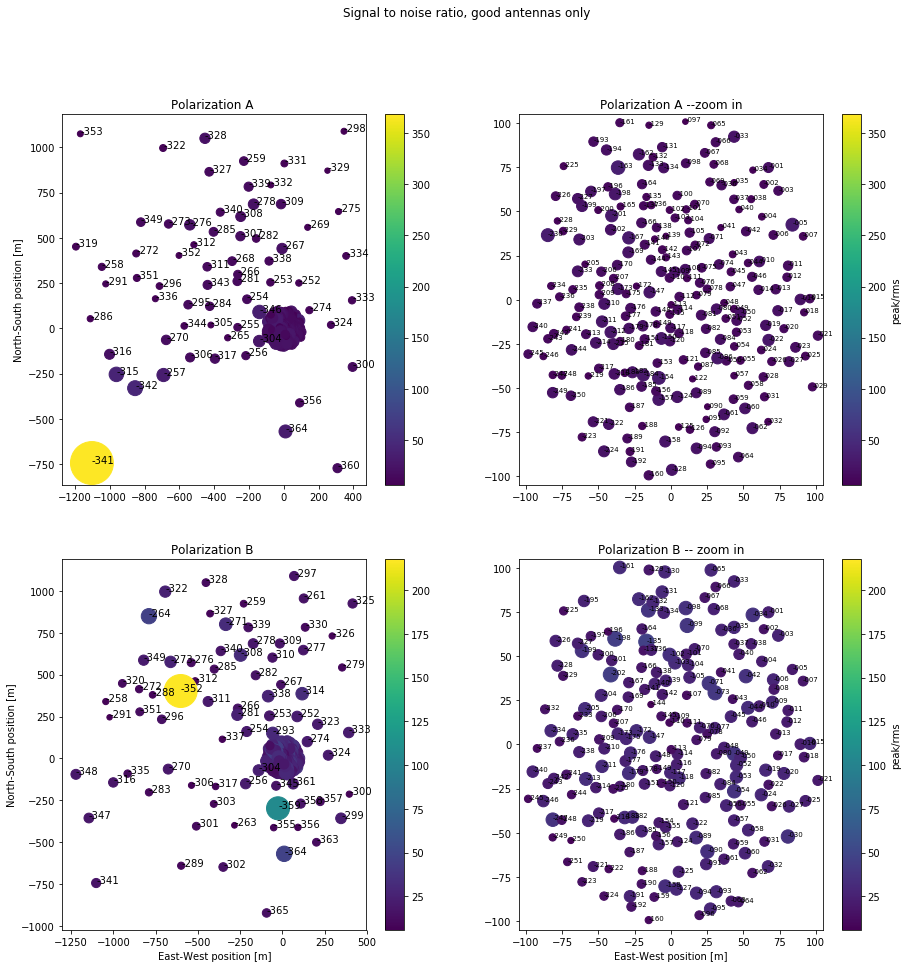

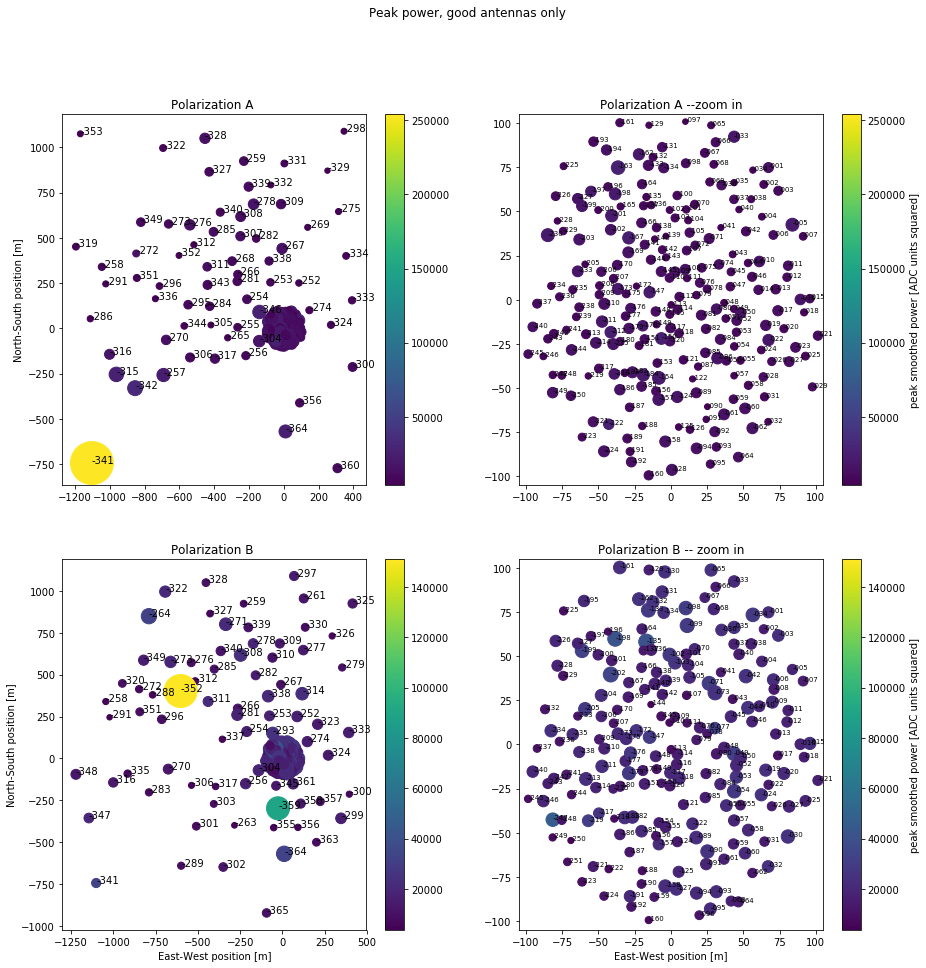

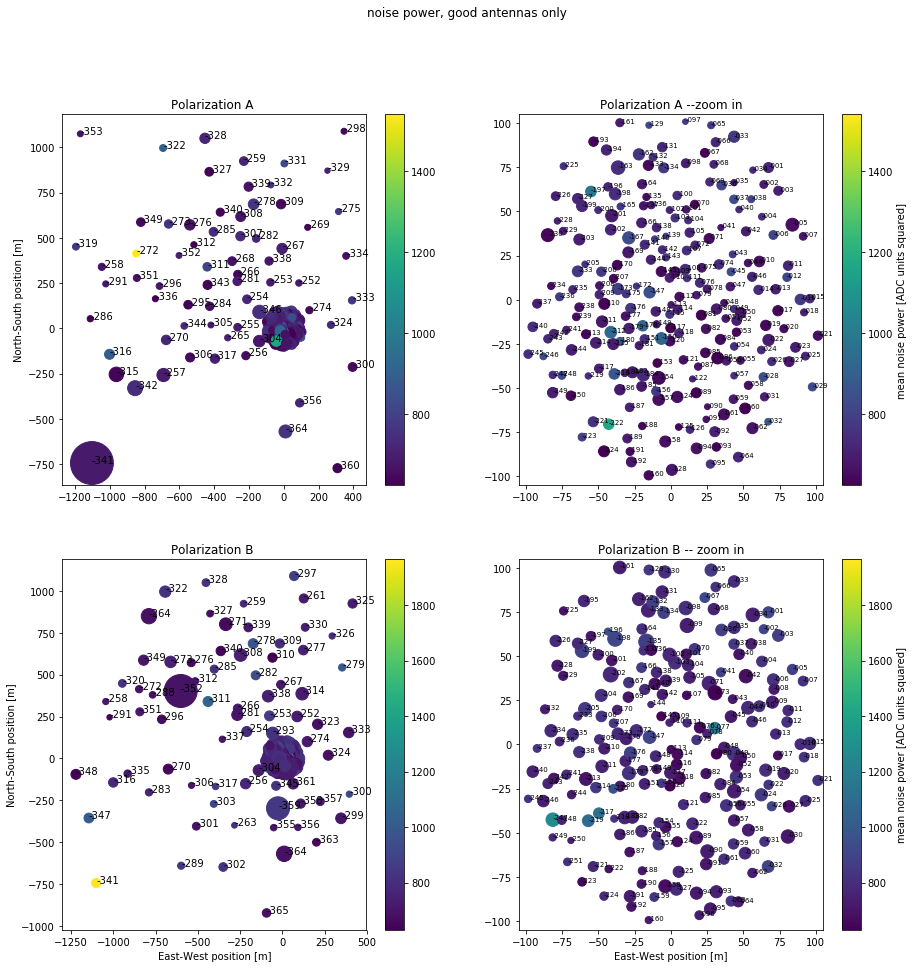

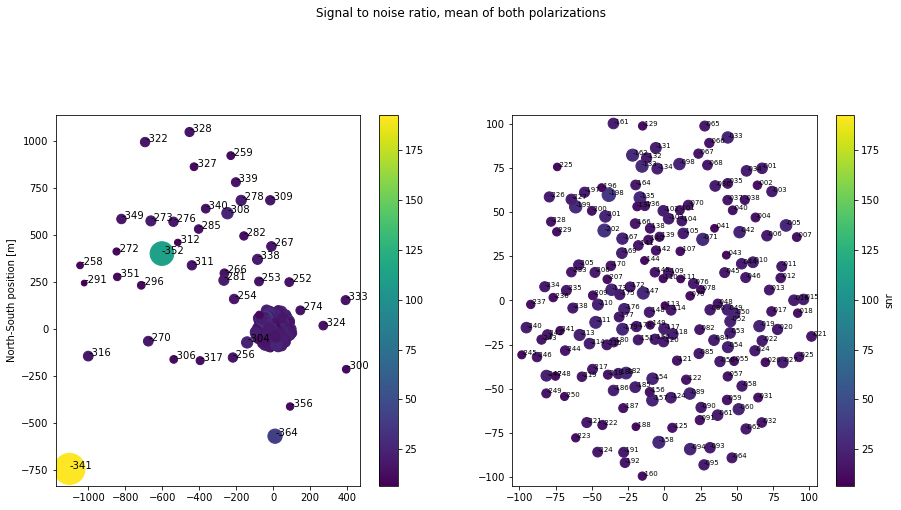

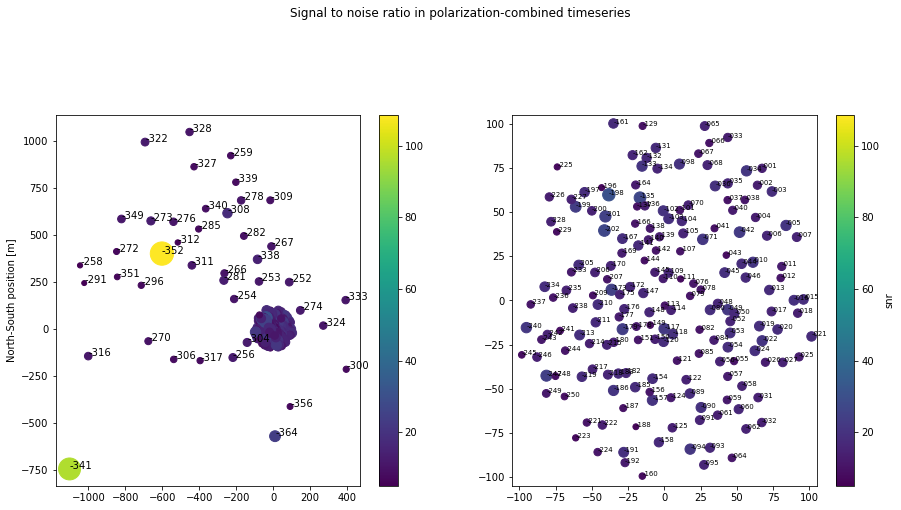

In [46]:
for f,datafname in enumerate(files_with_interesting_events[1:2]):
    print(f, datafname)
    saved_events_indices=np.load(dataproductsdir+datafname[:-3]+'indices_cuts1.npy')
    for i in saved_events_indices[3:4]:
        event_records=parsefile(datadir+datafname,start_ind=i,end_ind=704 )
        merged=mergepolarizations(event_records,arraymapdictionaries)
        #print(sum(['rmsB' in m.keys() for m in merged]))
        
        plot_event_snr(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=True,Filter=h)
        plot_event_peak(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=True,Filter=h)
        plot_event_noise(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=True,Filter=h)
        plot_event_snr_polaverage(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=True,Filter=h)
        plot_event_total_power_snr(event_records,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=True,Filter=h)
        coreA,coreB,farA,farB=rank_by_snr(event_records,arraymapdictionaries)
        

/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:377: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:449: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter1!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:452: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter2!='None':


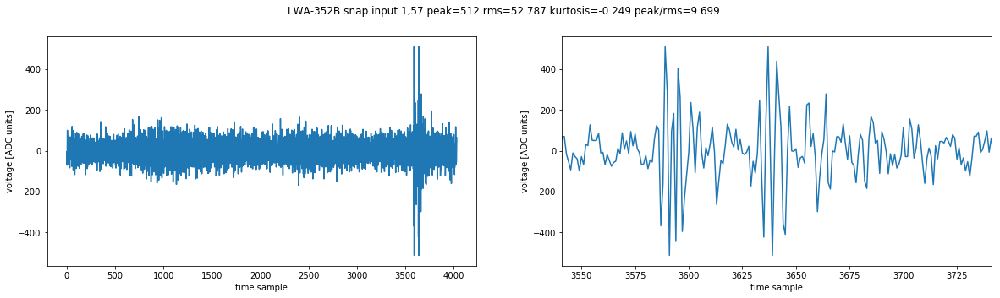

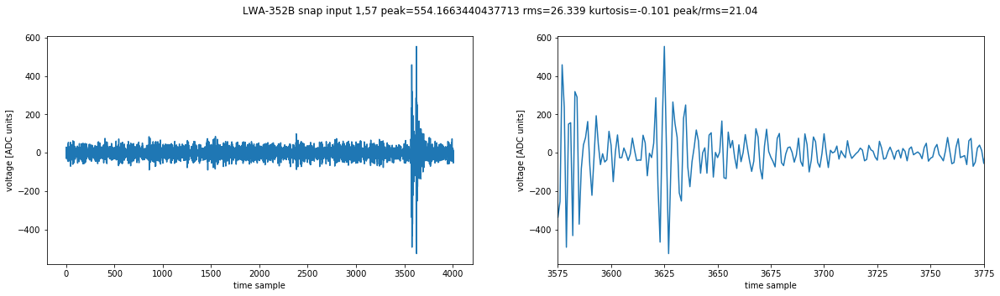

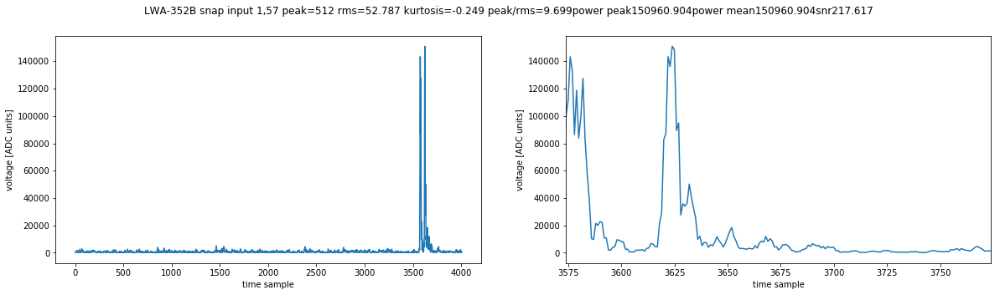

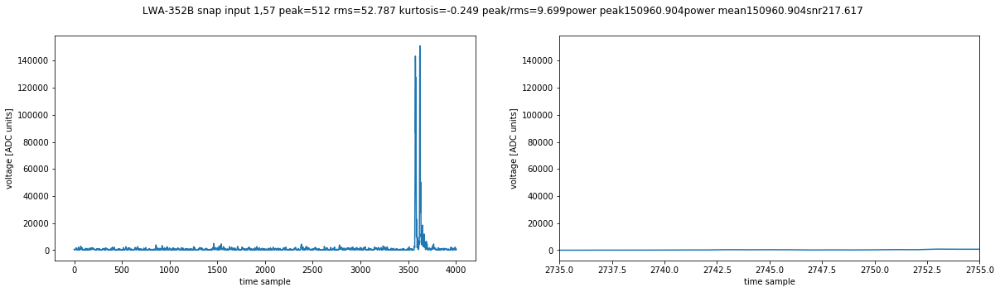

In [49]:
ants=['LWA-352B']
plot_timeseries(event_records,ants,zoom='peak')
plot_timeseries(event_records,ants,zoom='peak',Filter=h)

plot_power_timeseries(event_records,ants,zoom='peak',Filter1=h,Filter2=0.25*np.ones(4))
plot_power_timeseries(event_records,ants,zoom=(2735,2755),Filter1=h,Filter2=0.25*np.ones(4))



/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:377: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:449: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter1!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:452: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter2!='None':


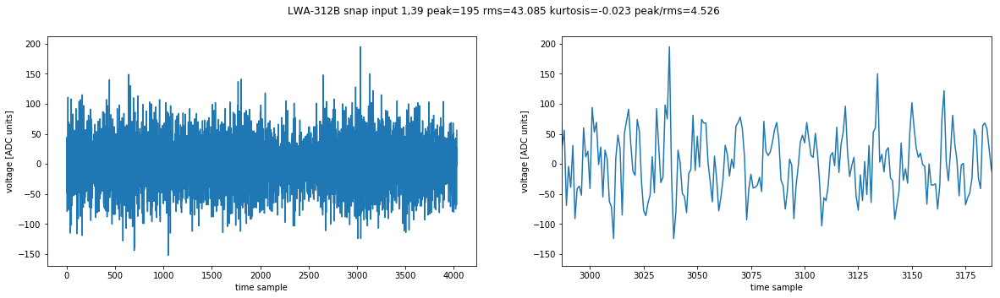

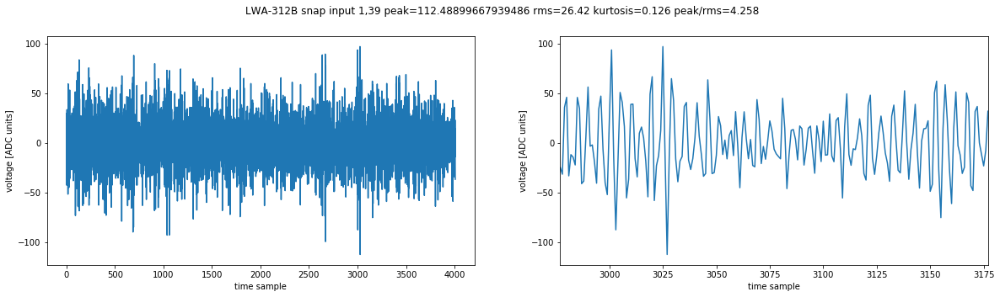

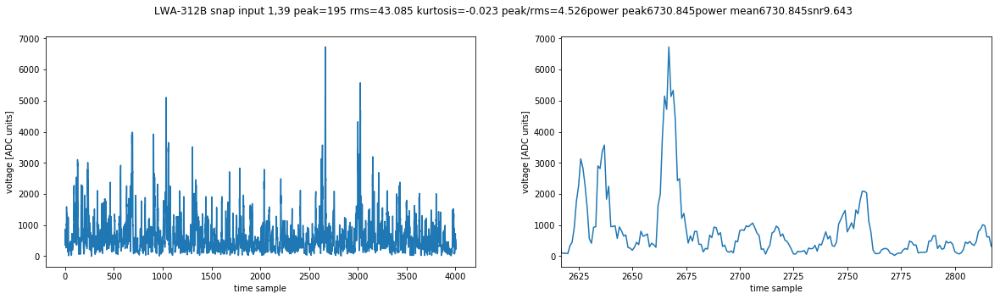

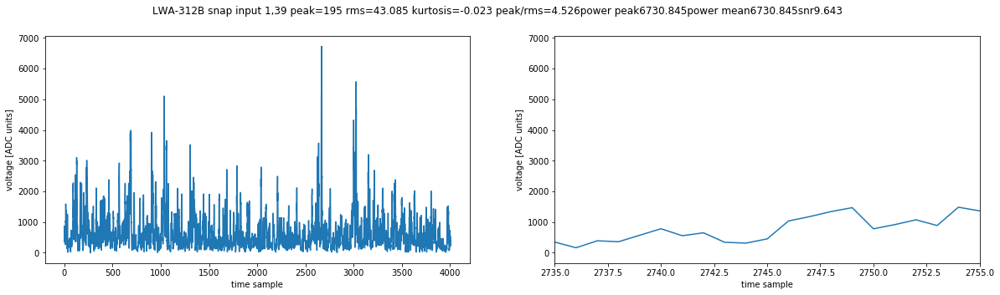

In [50]:
ants=['LWA-312B']
plot_timeseries(event_records,ants,zoom='peak')
plot_timeseries(event_records,ants,zoom='peak',Filter=h)

plot_power_timeseries(event_records,ants,zoom='peak',Filter1=h,Filter2=0.25*np.ones(4))
plot_power_timeseries(event_records,ants,zoom=(2735,2755),Filter1=h,Filter2=0.25*np.ones(4))



/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:377: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:449: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter1!='None':
/home/ubuntu/kp/lwa-cosmic-rays/cr_data_inspection_functions.py:452: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if Filter2!='None':


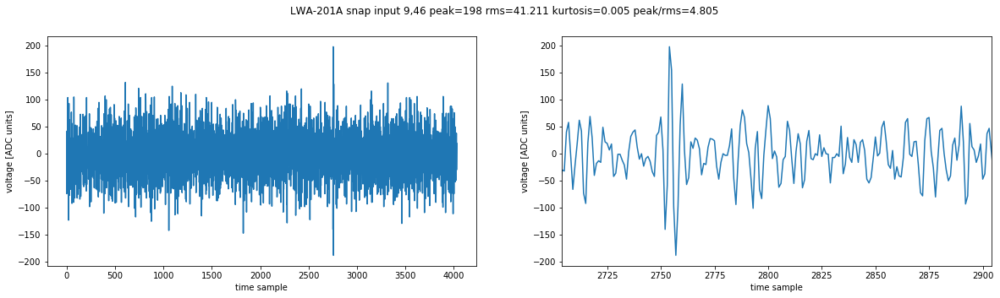

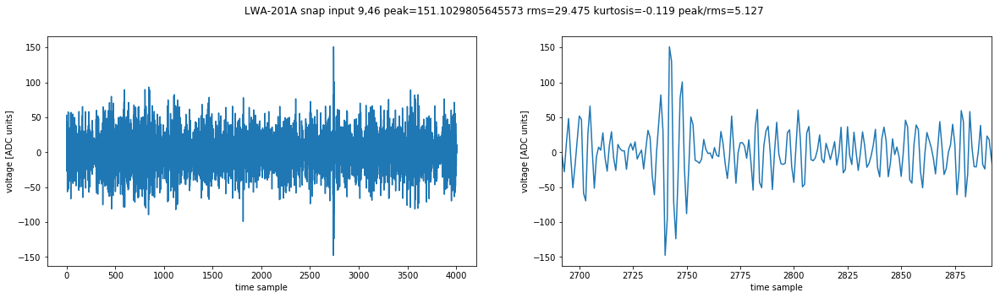

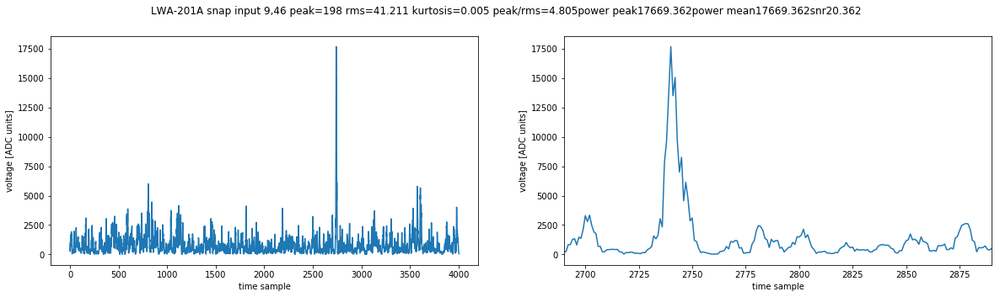

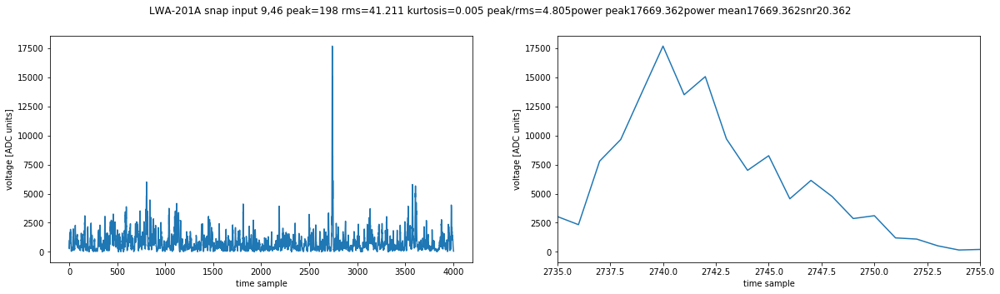

## Functions and further inspection-- needs to be copied to functions file

In [1]:
def plot_event_peak(event,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=False,Filter='None'):
    #Plots the peak of the smoothed power for each polarization of an event, over the antenna positions of the array
    #Event is a list of records (single-packet dictionaries) belonging to the same event
    #Antennas are filtered to only plot antennas whose signals (in the first half of the buffer) are within the
    #bounds set by minimum_ok_rms, maximum_ok_rms, minimum_ok_kurtosis, maximum_ok_kurtosis
    #Antennas are labelled if annotate=True
    #Filter can be None or a 1D numpy array of coefficients for a time-domain FIR. If filter is not none, the timeseries will be convolved with the provided coefficients during the mergepolarizations function.
    mergedrecords=mergepolarizations(event,arraymapdictionaries,Filter)

    xcoords=np.asarray([record['x'] for record in mergedrecords])
    ycoords=np.asarray([record['y'] for record in mergedrecords])
    zcoords=np.asarray([record['z'] for record in mergedrecords])
    antnames=[record['antname'] for record in mergedrecords]

    #get peak and noise
    noiseA=np.asarray([record['meansmoothedA'] for record in mergedrecords])
    peakA=np.asarray([record['peaksmoothedA'] for record in mergedrecords])
    noiseB=np.asarray([record['meansmoothedB'] for record in mergedrecords])
    peakB=np.asarray([record['peaksmoothedB'] for record in mergedrecords])
    
    snrA=peakA/noiseA
    snrB=peakB/noiseB
    
    #get kurtosis before event
    kurtosisA=np.asarray([record['kurtosisA'] for record in mergedrecords])
    kurtosisB=np.asarray([record['kurtosisB'] for record in mergedrecords])

    #define antenna cut based on rms 
    cut_rmsA = np.logical_and(noiseA >minimum_ok_rms**2, noiseA <maximum_ok_rms**2)
    cut_rmsB = np.logical_and(noiseB >minimum_ok_rms**2, noiseB <maximum_ok_rms**2)
    
    #define antenna cut based on kurtosis
    cut_kurtosisA = np.logical_and(kurtosisA >minimum_ok_kurtosis, kurtosisA <maximum_ok_kurtosis)
    cut_kurtosisB = np.logical_and(kurtosisB >minimum_ok_kurtosis, kurtosisB <maximum_ok_kurtosis)

    #combine antenna cuts
    cutA=np.logical_and(cut_rmsA,cut_kurtosisA)
    cutB=np.logical_and(cut_rmsB,cut_kurtosisB)
    
    select_core_antennas=(xcoords**2)+(ycoords**2)<(115**2)
    select_far_antennas=(xcoords**2)+(ycoords**2)>(115**2)  #note the core vs far cuts used in plotting are different than what's used for estimating if event is concentrated on core
    
    sizescale=5
    plt.figure(figsize=(15,15))
    plt.suptitle('Peak power, good antennas only')
    plt.subplot(221)
    plt.title("Polarization A ")
    plt.scatter(xcoords[cutA],ycoords[cutA],c=peakA[cutA],s=sizescale*(snrA[cutA]))
    plt.colorbar()
    #plt.clim(0,35)
    plt.ylabel('North-South position [m]')
    if annotate:
        for i in range(len(antnames)):
            if cutA[i] and select_far_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.annotate(txt[3:], (x, y))
    
    plt.subplot(222)
    plt.title("Polarization A --zoom in")
    plt.scatter(xcoords[cutA],ycoords[cutA],c=peakA[cutA],s=sizescale*(snrA[cutA]))
    plt.xlim(-105,105)
    plt.ylim(-105,105)
    plt.colorbar(label='peak smoothed power [ADC units squared]')
   # plt.clim(cmin,cmax)

    #plt.clim(cmin,cmax)
    if annotate:
        for i in range(len(antnames)):
            if cutA[i] and select_core_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.text(x,y,txt[3:],fontsize='x-small')
                
    plt.subplot(223)
    plt.title("Polarization B ")
    plt.scatter(xcoords[cutB],ycoords[cutB],c=peakB[cutB],s=sizescale*(snrB[cutB]))
    plt.colorbar()
    #plt.clim(cmin,cmax)

    plt.xlabel('East-West position [m]')
    plt.ylabel('North-South position [m]')
    if annotate:
        for i in range(len(antnames)):
            if cutB[i] and select_far_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.annotate(txt[3:], (x, y))

    plt.subplot(224)
    plt.title("Polarization B -- zoom in")
    plt.scatter(xcoords[cutB],ycoords[cutB],c=peakB[cutB],s=sizescale*(snrB[cutB]))
    plt.xlim(-105,105)
    plt.ylim(-105,105)
    plt.colorbar(label='peak smoothed power [ADC units squared]')
    plt.xlabel('East-West position [m]')
    #plt.clim(cmin,cmax)

    if annotate:
        for i in range(len(antnames)):
            if cutB[i] and select_core_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.text(x,y,txt[3:],fontsize='x-small')

    return

In [2]:
def plot_event_noise(event,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=False,Filter='None'):

    #Plots the noise power for each polarization of an event, over the antenna positions of the array
    #noise power is the mean smoothed power
    #Event is a list of records (single-packet dictionaries) belonging to the same event
    #Antennas are filtered to only plot antennas whose signals (in the first half of the buffer) are within the
    #bounds set by minimum_ok_rms, maximum_ok_rms, minimum_ok_kurtosis, maximum_ok_kurtosis
    #Antennas are labelled if annotate=True
    #Filter can be None or a 1D numpy array of coefficients for a time-domain FIR. If filter is not none, the timeseries will be convolved with the provided coefficients during the mergepolarizations function.
    mergedrecords=mergepolarizations(event,arraymapdictionaries,Filter)

    xcoords=np.asarray([record['x'] for record in mergedrecords])
    ycoords=np.asarray([record['y'] for record in mergedrecords])
    zcoords=np.asarray([record['z'] for record in mergedrecords])
    antnames=[record['antname'] for record in mergedrecords]

    #get snr ratio
    noiseA=np.asarray([record['meansmoothedA'] for record in mergedrecords])
    peakA=np.asarray([record['peaksmoothedA'] for record in mergedrecords])
    noiseB=np.asarray([record['meansmoothedB'] for record in mergedrecords])
    peakB=np.asarray([record['peaksmoothedB'] for record in mergedrecords])

    snrA=peakA/noiseA
    snrB=peakB/noiseB
    
    #get kurtosis before event
    kurtosisA=np.asarray([record['kurtosisA'] for record in mergedrecords])
    kurtosisB=np.asarray([record['kurtosisB'] for record in mergedrecords])

    #define antenna cut based on rms 
    cut_rmsA = np.logical_and(noiseA >minimum_ok_rms**2, noiseA <maximum_ok_rms**2)
    cut_rmsB = np.logical_and(noiseB >minimum_ok_rms**2, noiseB <maximum_ok_rms**2)
    
    #define antenna cut based on kurtosis
    cut_kurtosisA = np.logical_and(kurtosisA >minimum_ok_kurtosis, kurtosisA <maximum_ok_kurtosis)
    cut_kurtosisB = np.logical_and(kurtosisB >minimum_ok_kurtosis, kurtosisB <maximum_ok_kurtosis)

    #combine antenna cuts
    cutA=np.logical_and(cut_rmsA,cut_kurtosisA)
    cutB=np.logical_and(cut_rmsB,cut_kurtosisB)
    
    select_core_antennas=(xcoords**2)+(ycoords**2)<(115**2)
    select_far_antennas=(xcoords**2)+(ycoords**2)>(115**2)  #note the core vs far cuts used in plotting are different than what's used for estimating if event is concentrated on core
    
    sizescale=5
    plt.figure(figsize=(15,15))
    plt.suptitle('noise power, good antennas only')
    plt.subplot(221)
    plt.title("Polarization A ")
    plt.scatter(xcoords[cutA],ycoords[cutA],c=noiseA[cutA],s=sizescale*(snrA[cutA]))
    plt.colorbar()
    #plt.clim(0,35)
    plt.ylabel('North-South position [m]')
    if annotate:
        for i in range(len(antnames)):
            if cutA[i] and select_far_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.annotate(txt[3:], (x, y))
    
    plt.subplot(222)
    plt.title("Polarization A --zoom in")
    plt.scatter(xcoords[cutA],ycoords[cutA],c=noiseA[cutA],s=sizescale*(snrA[cutA]))
    plt.xlim(-105,105)
    plt.ylim(-105,105)
    plt.colorbar(label='mean noise power [ADC units squared]')
    #plt.clim(cmin,cmax)

    #plt.clim(cmin,cmax)
    if annotate:
        for i in range(len(antnames)):
            if cutA[i] and select_core_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.text(x,y,txt[3:],fontsize='x-small')
                
    plt.subplot(223)
    plt.title("Polarization B ")
    plt.scatter(xcoords[cutB],ycoords[cutB],c=noiseB[cutB],s=sizescale*(snrB[cutB]))
    plt.colorbar()
    #plt.clim(cmin,cmax)

    plt.xlabel('East-West position [m]')
    plt.ylabel('North-South position [m]')
    if annotate:
        for i in range(len(antnames)):
            if cutB[i] and select_far_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.annotate(txt[3:], (x, y))

    plt.subplot(224)
    plt.title("Polarization B -- zoom in")
    plt.scatter(xcoords[cutB],ycoords[cutB],c=noiseB[cutB],s=sizescale*(snrB[cutB]))
    plt.xlim(-105,105)
    plt.ylim(-105,105)
    plt.colorbar(label='mean noise power [ADC units squared]')
    plt.xlabel('East-West position [m]')
    #plt.clim(cmin,cmax)

    if annotate:
        for i in range(len(antnames)):
            if cutB[i] and select_core_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.text(x,y,txt[3:],fontsize='x-small')

    return

In [5]:
def plot_event_snr_polaverage(event,arraymapdictionaries,minimum_ok_rms=25,maximum_ok_rms=45,minimum_ok_kurtosis=-1,maximum_ok_kurtosis=1,annotate=False,Filter='None'):
    #cmin=0
    #cmax=35
    #Plots the average of the pol A and pol B snrs, over the antenna positions of the array
    #snr is defined as peak of smoothed power divided by mean smoothed power
    #Event is a list of records (single-packet dictionaries) belonging to the same event
    #Antennas are filtered to only plot antennas whose signals (in the first half of the buffer) are within the
    #bounds set by minimum_ok_rms, maximum_ok_rms, minimum_ok_kurtosis, maximum_ok_kurtosis
    #Antennas are labelled if annotate=True
    #Filter can be None or a 1D numpy array of coefficients for a time-domain FIR. If filter is not none, the timeseries will be convolved with the provided coefficients during the mergepolarizations function.
    mergedrecords=mergepolarizations(event,arraymapdictionaries,Filter)

    xcoords=np.asarray([record['x'] for record in mergedrecords])
    ycoords=np.asarray([record['y'] for record in mergedrecords])
    zcoords=np.asarray([record['z'] for record in mergedrecords])
    antnames=[record['antname'] for record in mergedrecords]
        
    #get snr ratio
    noiseA=np.asarray([record['meansmoothedA'] for record in mergedrecords])
    peakA=np.asarray([record['peaksmoothedA'] for record in mergedrecords])
    noiseB=np.asarray([record['meansmoothedB'] for record in mergedrecords])
    peakB=np.asarray([record['peaksmoothedB'] for record in mergedrecords])

    snrA=peakA/noiseA
    snrB=peakB/noiseB
    snr=(snrA+snrB)/2
    
    #get kurtosis before event
    kurtosisA=np.asarray([record['kurtosisA'] for record in mergedrecords])
    kurtosisB=np.asarray([record['kurtosisB'] for record in mergedrecords])

    #define antenna cut based on rms 
    cut_rmsA = np.logical_and(noiseA >minimum_ok_rms**2, noiseA <maximum_ok_rms**2)
    cut_rmsB = np.logical_and(noiseB >minimum_ok_rms**2, noiseB <maximum_ok_rms**2)
    
    #define antenna cut based on kurtosis
    cut_kurtosisA = np.logical_and(kurtosisA >minimum_ok_kurtosis, kurtosisA <maximum_ok_kurtosis)
    cut_kurtosisB = np.logical_and(kurtosisB >minimum_ok_kurtosis, kurtosisB <maximum_ok_kurtosis)

    #combine antenna cuts
    cutA=np.logical_and(cut_rmsA,cut_kurtosisA)
    cutB=np.logical_and(cut_rmsB,cut_kurtosisB)
    cut_total=np.logical_and(cutA,cutB)
    
    select_core_antennas=(xcoords**2)+(ycoords**2)<(115**2)
    select_far_antennas=(xcoords**2)+(ycoords**2)>(115**2)  #note the core vs far cuts used in plotting are different than what's used for estimating if event is concentrated on core
    
    sizescale=5
    plt.figure(figsize=(15,15))
    plt.suptitle('Signal to noise ratio, mean of both polarizations')
    plt.subplot(221)
    #plt.title("Polarization A ")
    plt.scatter(xcoords[cut_total],ycoords[cut_total],c=snr[cut_total],s=sizescale*(snr[cut_total]))
    plt.colorbar()
    #plt.clim(0,35)
    plt.ylabel('North-South position [m]')
    if annotate:
        for i in range(len(antnames)):
            if cut_total[i] and select_far_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.annotate(txt[3:], (x, y))
    
    plt.subplot(222)
    #plt.title("Polarization A --zoom in")
    plt.scatter(xcoords[cut_total],ycoords[cut_total],c=snr[cut_total],s=sizescale*(snr[cut_total]))
    plt.xlim(-105,105)
    plt.ylim(-105,105)
    plt.colorbar(label='snr')
   # plt.clim(cmin,cmax)

    #plt.clim(cmin,cmax)
    if annotate:
        for i in range(len(antnames)):
            if cut_total[i] and select_core_antennas[i]:
                txt=antnames[i]
                x=xcoords[i]
                y=ycoords[i]
                plt.text(x,y,txt[3:],fontsize='x-small')
                
    return